## Análisis exploratorio de los fichero concatenados previo a su procesamiento

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

### Defunciones:

In [2]:
# Lectura del csv de defunciones:
df = pd.read_csv('../01-Ficheros Concatenados/defunciones.csv')

In [3]:
# Cabecera de los datos:
df.head()

,Any,Codi_Districte,Nom_Districte,Codi_Barri,Nom_Barri,AEB,Seccio_Censal,Valor,SEXE,EDAT_Q
0,2007,1,Ciutat Vella,1,el Raval,1,1001,..,1,10
1,2007,1,Ciutat Vella,1,el Raval,1,1001,..,1,14
2,2007,1,Ciutat Vella,1,el Raval,1,1001,..,1,16
3,2007,1,Ciutat Vella,1,el Raval,1,1001,..,1,17
4,2007,1,Ciutat Vella,1,el Raval,1,1001,..,1,18


In [4]:
# Información de las columnas:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 154780 entries, 0 to 154779
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   Any             154780 non-null  int64 
 1   Codi_Districte  154780 non-null  int64 
 2   Nom_Districte   154780 non-null  object
 3   Codi_Barri      154780 non-null  int64 
 4   Nom_Barri       154780 non-null  object
 5   AEB             154780 non-null  int64 
 6   Seccio_Censal   154780 non-null  int64 
 7   Valor           154780 non-null  object
 8   SEXE            154780 non-null  int64 
 9   EDAT_Q          154780 non-null  int64 
dtypes: int64(7), object(3)
memory usage: 11.8+ MB


In [5]:
# Descripción del dataframe:
df.describe()

,Any,Codi_Districte,Codi_Barri,AEB,Seccio_Censal,SEXE,EDAT_Q
count,154780.000000,154780.000000,154780.000000,154780.000000,154780.000000,154780.000000,154780.000000
mean,2014.524493,5.652662,32.751202,118.260214,5713.510518,1.508115,15.248430
std,4.635891,2.957419,21.980446,65.926228,2958.179790,0.499936,3.103786
min,2007.000000,1.000000,1.000000,1.000000,1001.000000,1.000000,0.000000
25%,2010.000000,3.000000,12.000000,60.000000,3025.000000,1.000000,14.000000
50%,2015.000000,6.000000,31.000000,121.000000,6028.000000,2.000000,16.000000
75%,2019.000000,8.000000,52.000000,174.000000,8086.000000,2.000000,17.000000
max,2022.000000,10.000000,73.000000,233.000000,10237.000000,2.000000,21.000000


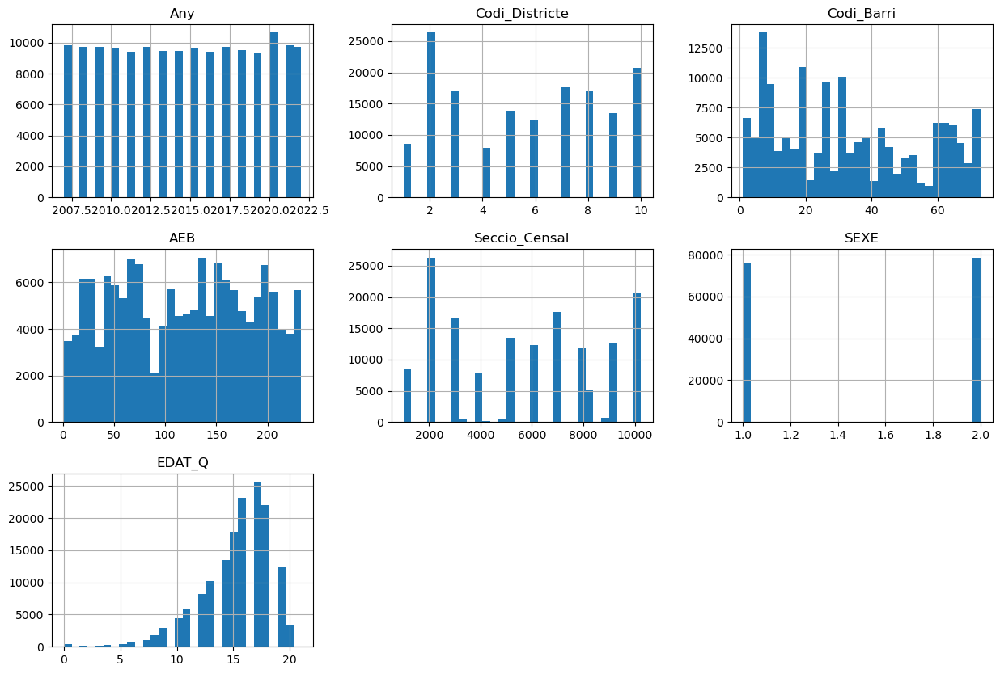

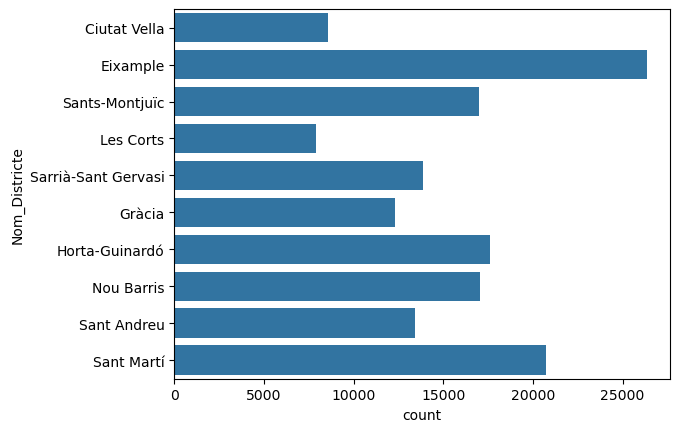

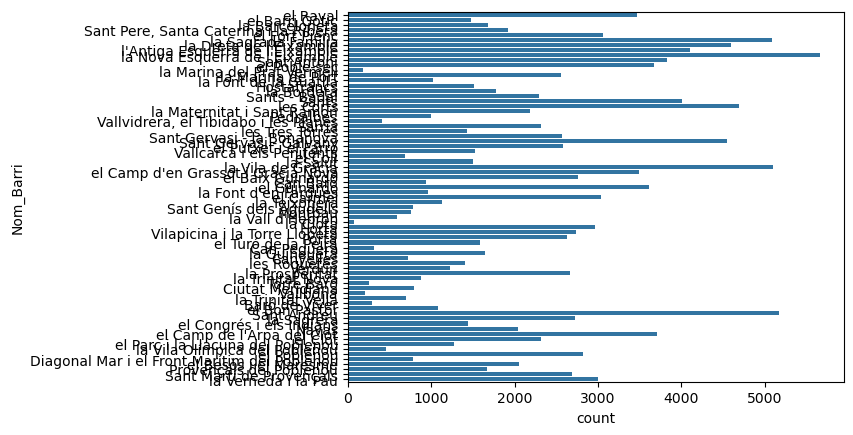

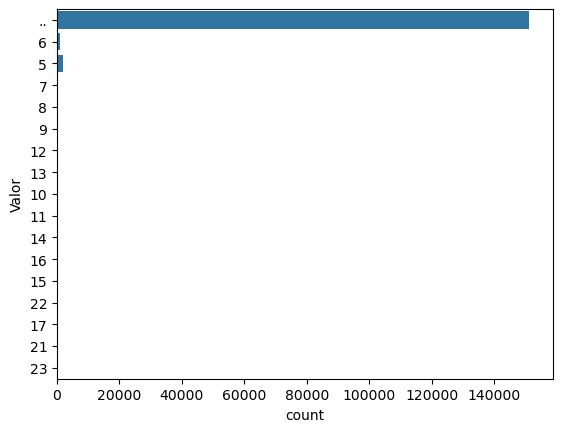

In [6]:
# Análisis de las variables:
df.hist(bins=30, figsize=(15, 10))
plt.show()

for column in df.select_dtypes(include=['object']).columns:
    sns.countplot(y=column, data=df)
    plt.show()


c:\Users\patry\anaconda3\envs\BaseGrafos\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


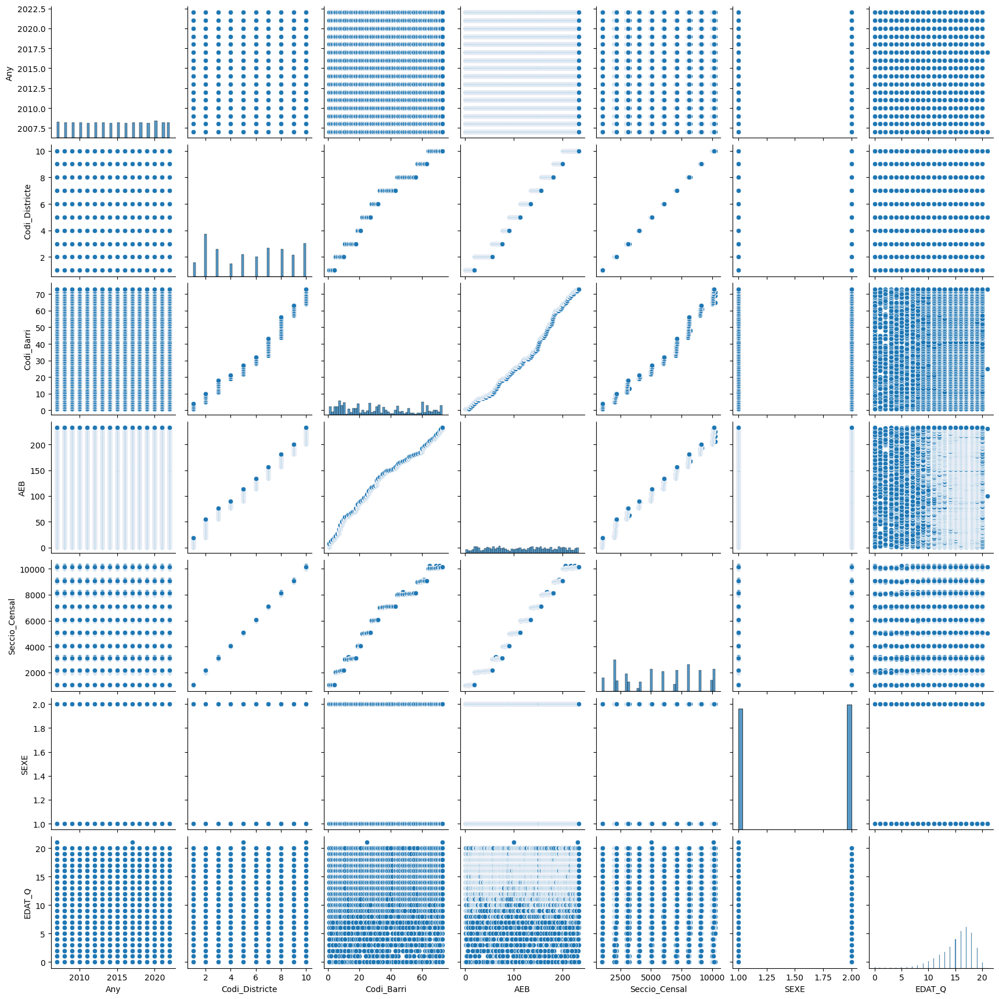

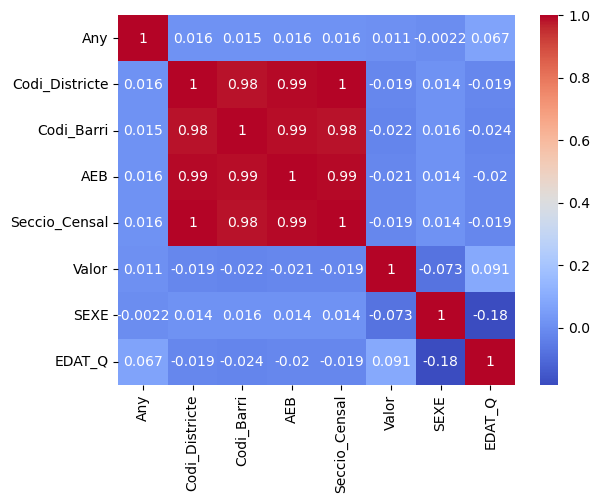

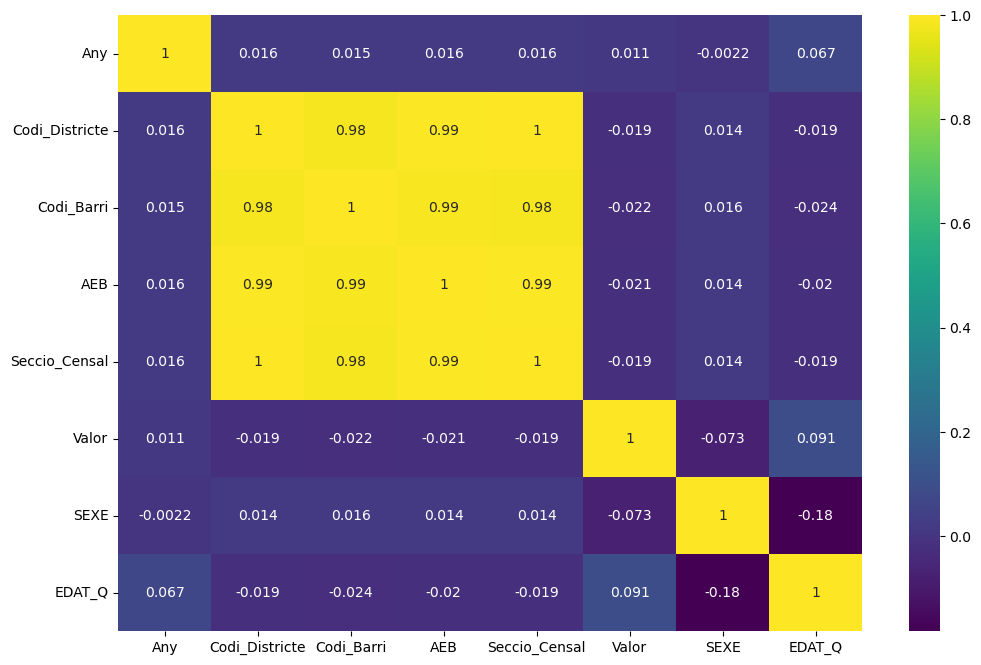

In [7]:
# Análisis de correlación:
sns.pairplot(df)
plt.show()

# Se quitan las variables no numéricas y se reemplazan los valores .. por 0 para poder realizar la correlación:
df=df.drop(columns=['Nom_Districte','Nom_Barri'])
df['Valor']=df['Valor'].replace('..',0)

# Se define la matriz de correlación y se pinta:
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='viridis')
plt.show()

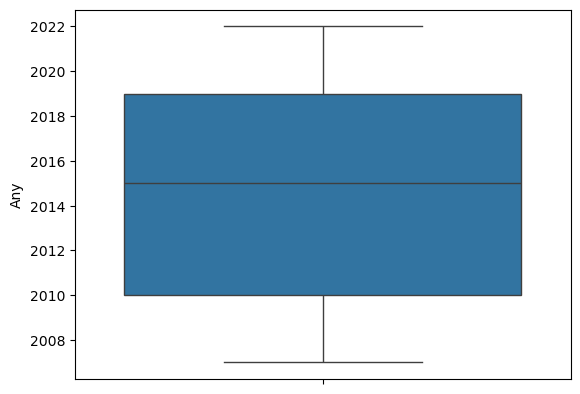

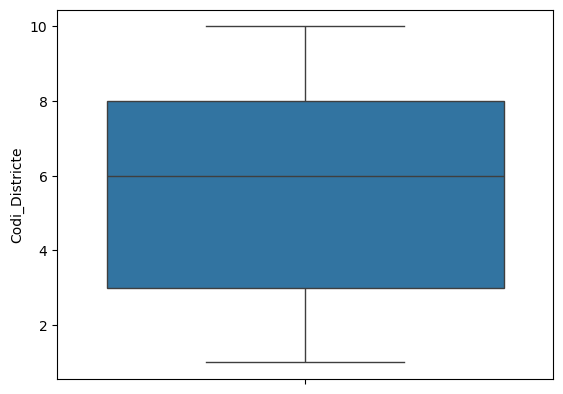

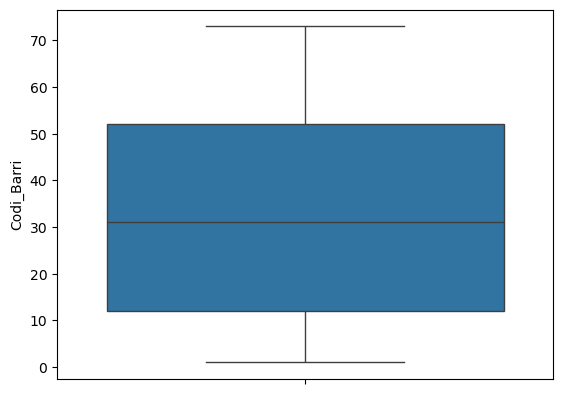

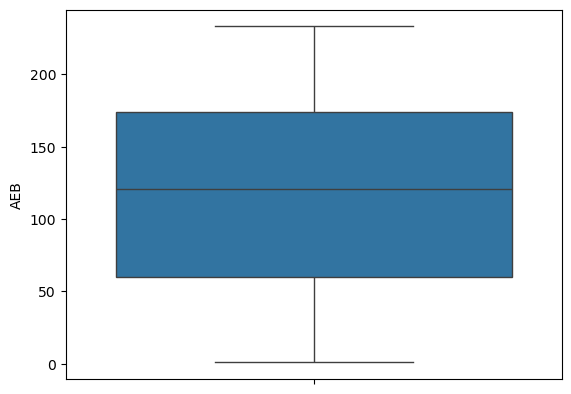

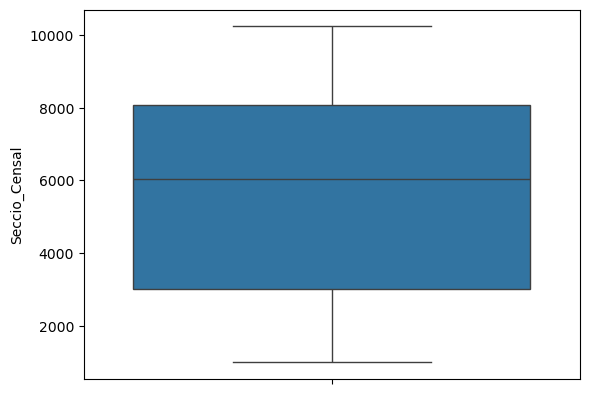

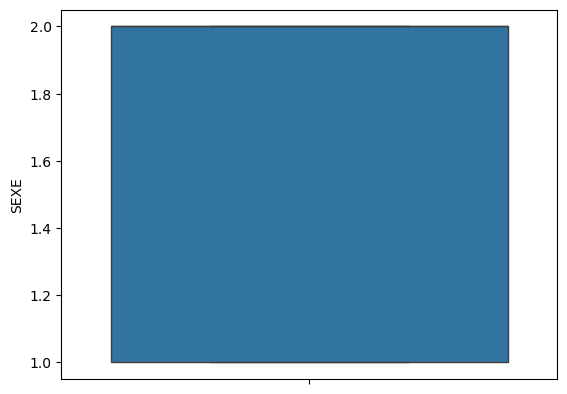

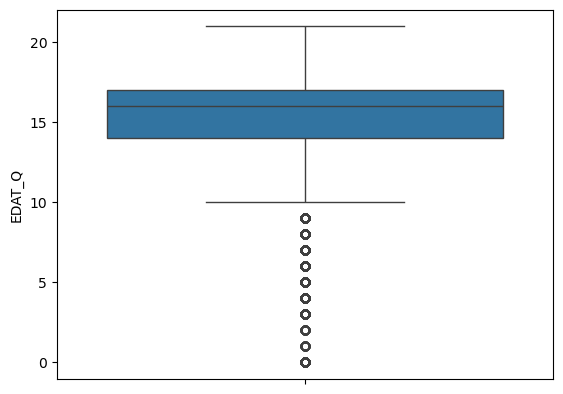

In [8]:
# Análisis de outliers:
for column in df.select_dtypes(include=[np.number]).columns:
    sns.boxplot(df[column])
    plt.show()

### Densidad poblacional:

In [9]:
# Lectura del csv de densidad poblacional:
df = pd.read_csv('../01-Ficheros Concatenados/densidad.csv')

In [10]:
# Cabecera de los datos:
df.head()

,Any,Codi_Districte,Nom_Districte,Codi_Barri,Nom_Barri,Població,Superfície (ha),Densitat (hab/ha),Densitat neta (hab/ha),Superfície Residencial (ha)
0,2010,1,Ciutat Vella,1,el Raval,47251,109.8,430,949,NaN
1,2010,1,Ciutat Vella,2,el Barri Gòtic,18530,84.2,220,543,NaN
2,2010,1,Ciutat Vella,3,la Barceloneta,16099,131.4,123,1235,NaN
3,2010,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",22627,111.4,203,701,NaN
4,2010,2,Eixample,5,el Fort Pienc,32630,92.9,351,975,NaN


In [11]:
# Información de las columnas:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 876 entries, 0 to 875
Data columns (total 10 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Any                          876 non-null    int64  
 1   Codi_Districte               876 non-null    int64  
 2   Nom_Districte                876 non-null    object 
 3   Codi_Barri                   876 non-null    int64  
 4   Nom_Barri                    876 non-null    object 
 5   Població                     876 non-null    int64  
 6   Superfície (ha)              876 non-null    float64
 7   Densitat (hab/ha)            876 non-null    int64  
 8   Densitat neta (hab/ha)       876 non-null    int64  
 9   Superfície Residencial (ha)  365 non-null    float64
dtypes: float64(2), int64(6), object(2)
memory usage: 68.6+ KB


In [12]:
# Descripción del dataframe:
df.describe()

,Any,Codi_Districte,Codi_Barri,Població,Superfície (ha),Densitat (hab/ha),Densitat neta (hab/ha),Superfície Residencial (ha)
count,876.000000,876.000000,876.000000,876.000000,876.000000,876.000000,876.000000,365.000000
mean,2015.500000,6.246575,37.000000,22216.969178,139.656849,250.557078,686.094749,37.192329
std,3.454025,2.789929,21.083345,14495.865636,207.889267,153.347621,293.110072,32.329267
min,2010.000000,1.000000,1.000000,438.000000,11.900000,1.000000,19.000000,3.900000
25%,2012.750000,4.000000,19.000000,10465.000000,59.100000,116.750000,494.500000,16.900000
50%,2015.500000,7.000000,37.000000,20510.500000,92.900000,242.000000,713.000000,28.100000
75%,2018.250000,8.000000,55.000000,30680.250000,132.600000,351.000000,891.000000,45.000000
max,2021.000000,10.000000,73.000000,58579.000000,1428.400000,601.000000,1511.000000,242.400000


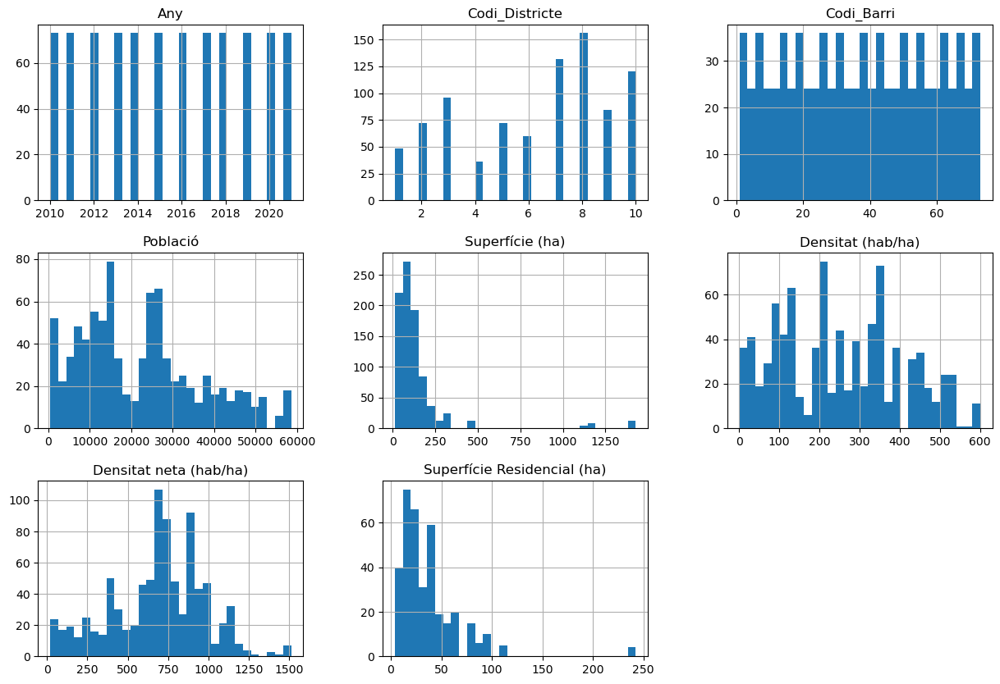

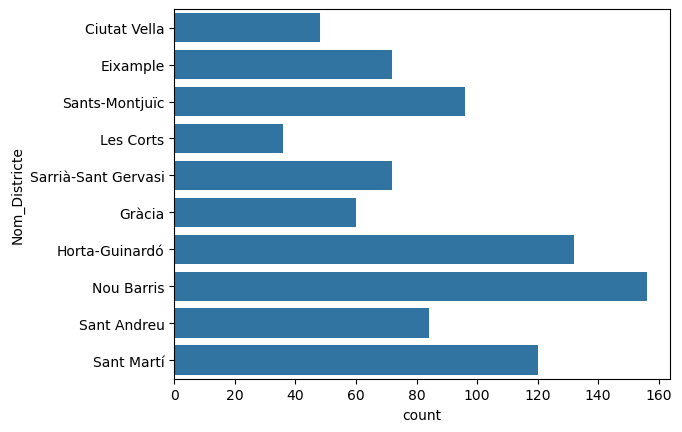

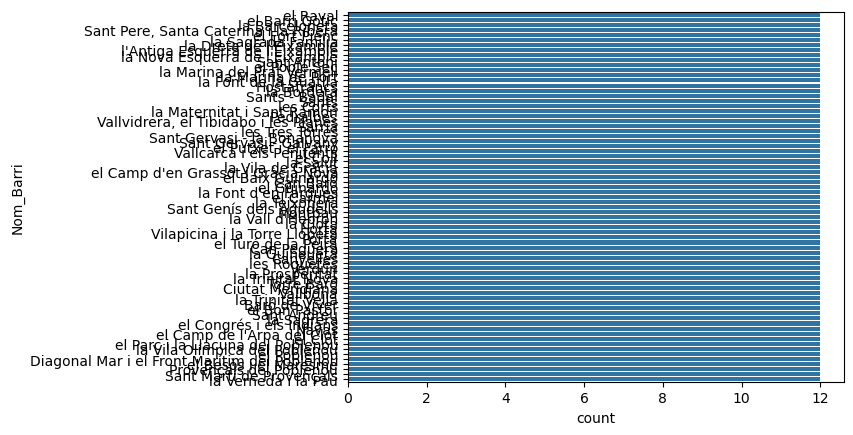

In [13]:
# Análisis de las variables:
df.hist(bins=30, figsize=(15, 10))
plt.show()

for column in df.select_dtypes(include=['object']).columns:
    sns.countplot(y=column, data=df)
    plt.show()

c:\Users\patry\anaconda3\envs\BaseGrafos\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


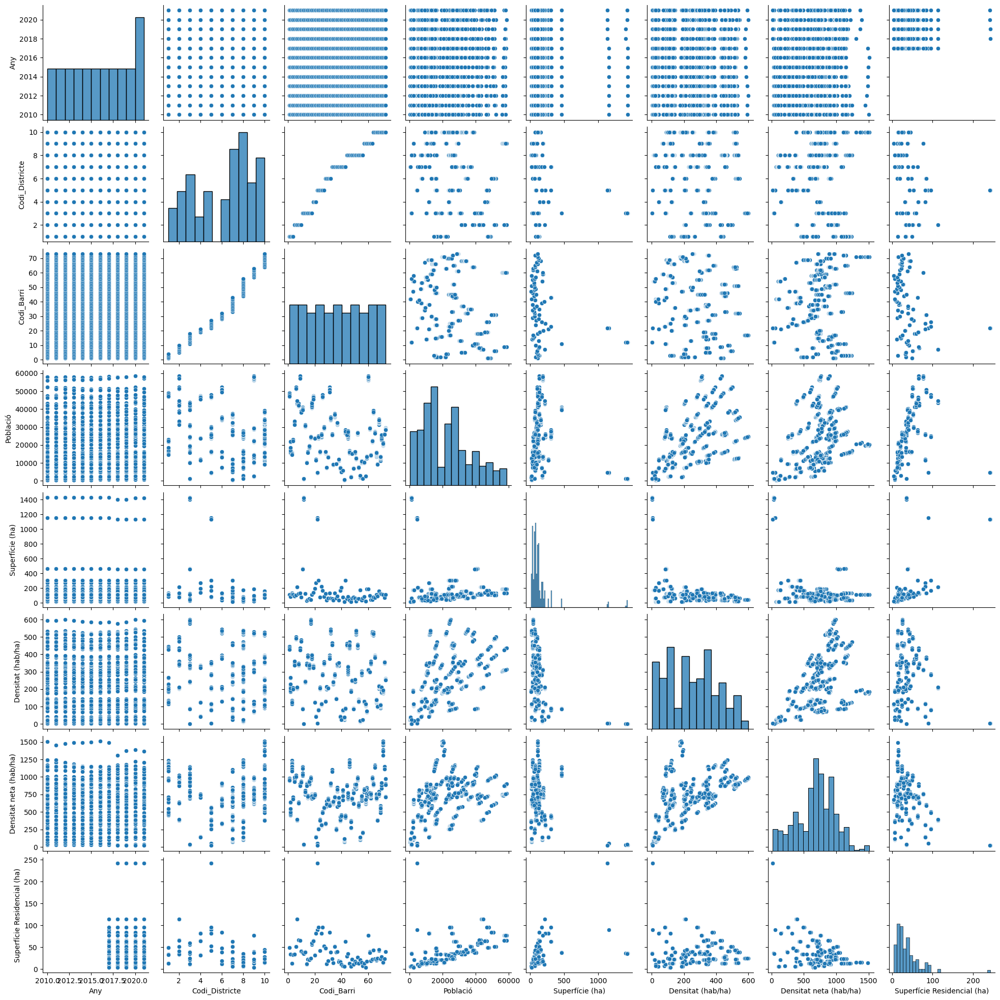

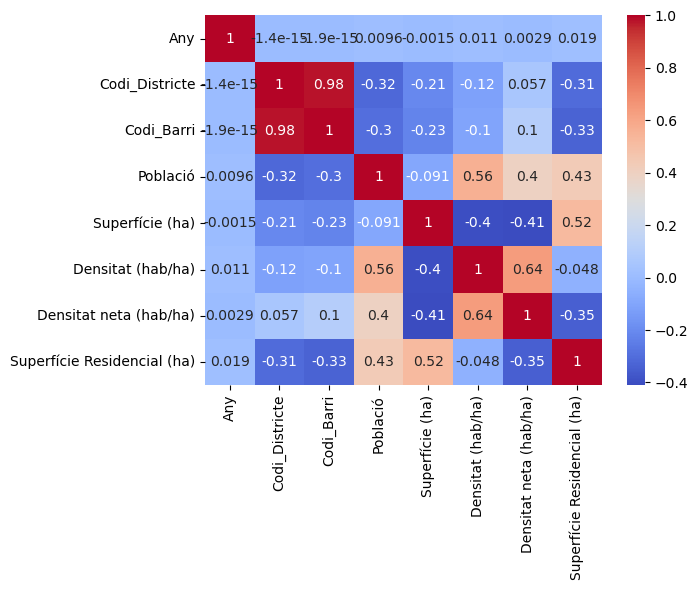

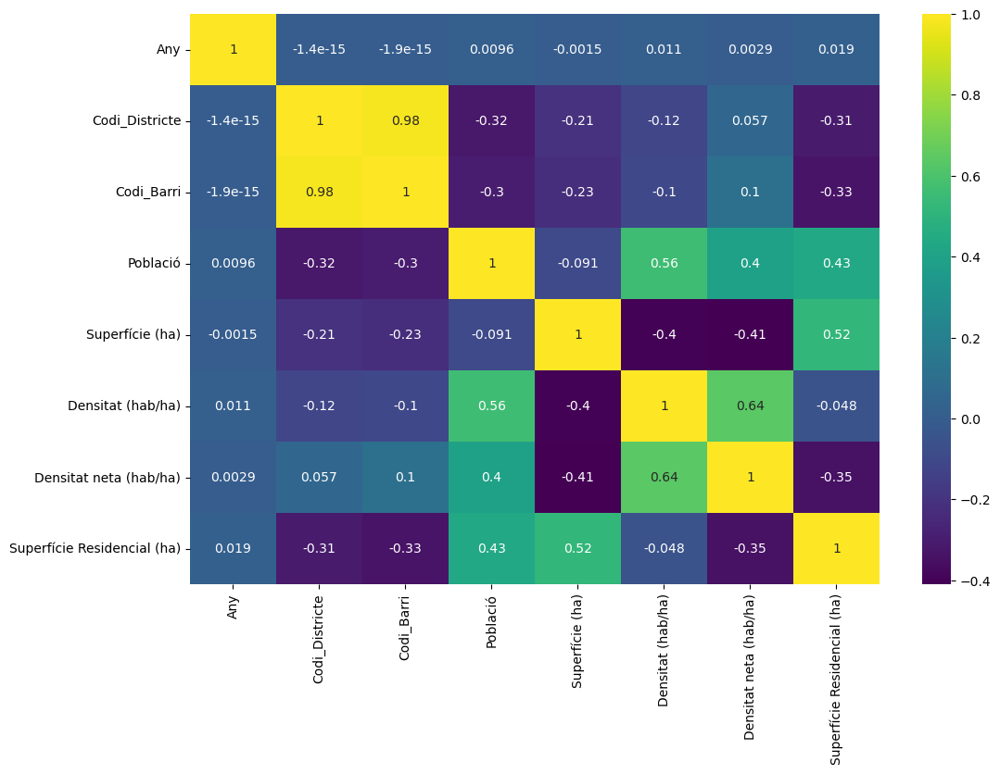

In [14]:
# Análisis de correlación:
sns.pairplot(df)
plt.show()

# Se quitan las variables no numéricas para poder realizar la correlación:
df=df.drop(columns=['Nom_Districte','Nom_Barri'])

# Se define la matriz de correlación y se pinta:
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='viridis')
plt.show()


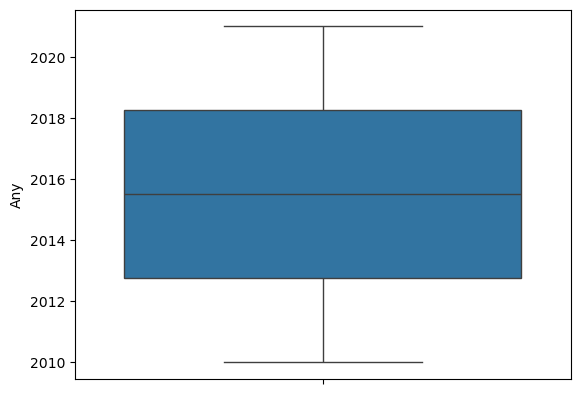

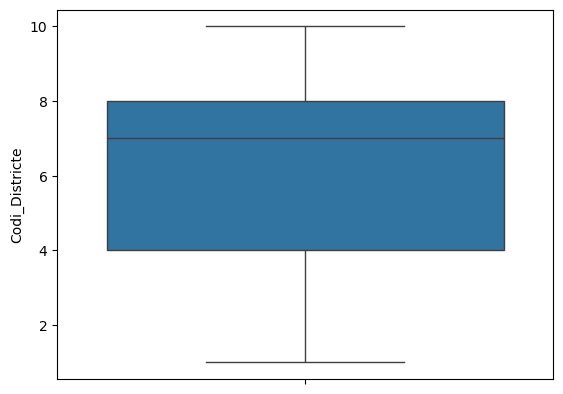

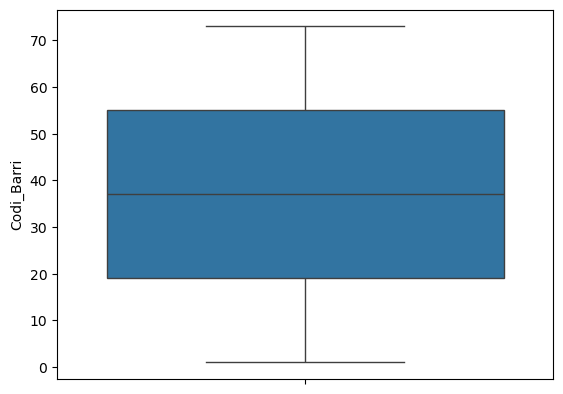

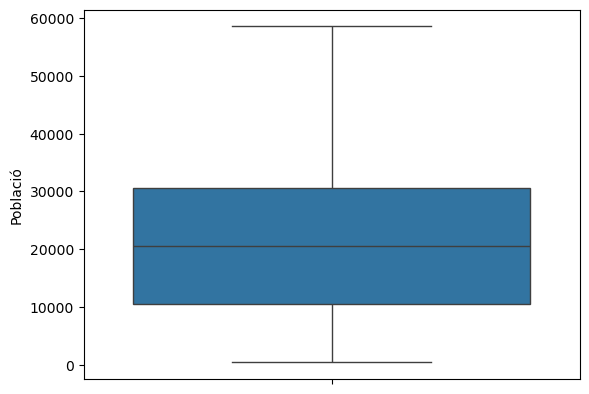

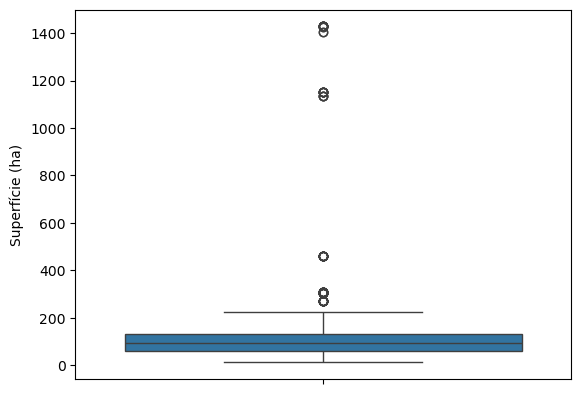

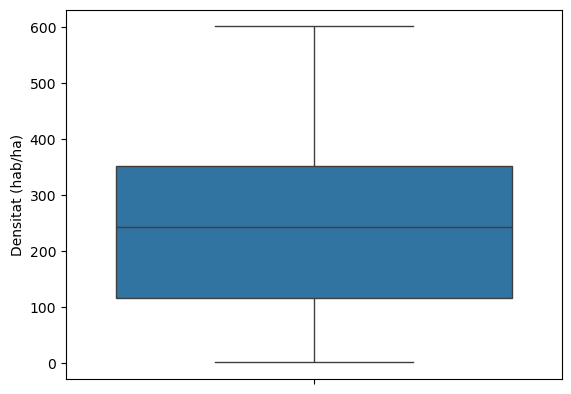

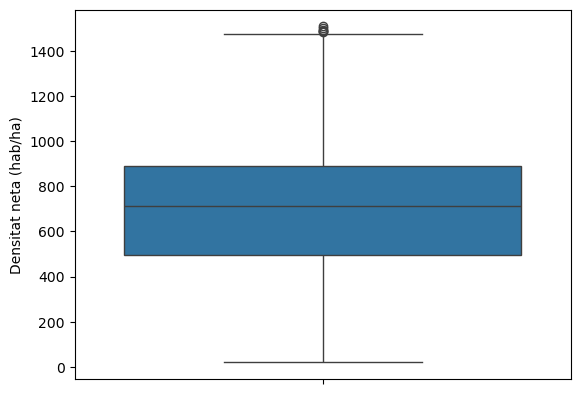

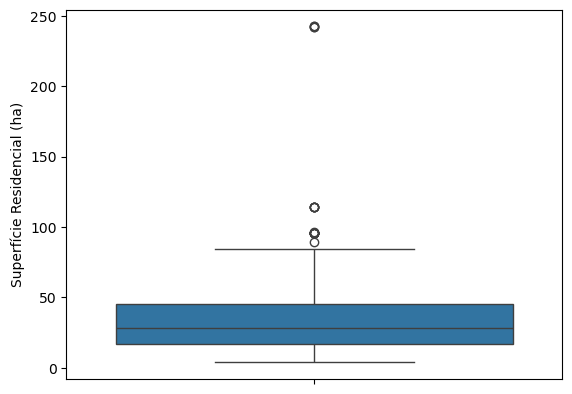

In [15]:
# Análisis de outliers:
for column in df.select_dtypes(include=[np.number]).columns:
    sns.boxplot(df[column])
    plt.show()

### Emigrantes:

In [16]:
# Lectura del csv de emigrantes:
df = pd.read_csv('../01-Ficheros Concatenados/emigrantes.csv')

In [17]:
# Cabecera de los datos:
df.head()

,Any,Codi_Districte,Nom_Districte,Codi_Barri,Nom_Barri,AEB,Seccio_Censal,Valor,SEXE,EDAT_Q
0,2007,1,Ciutat Vella,1,el Raval,1,1001,5,1,0
1,2007,1,Ciutat Vella,1,el Raval,1,1001,..,1,2
2,2007,1,Ciutat Vella,1,el Raval,1,1001,..,1,4
3,2007,1,Ciutat Vella,1,el Raval,1,1001,6,1,5
4,2007,1,Ciutat Vella,1,el Raval,1,1001,9,1,6


In [18]:
# Información de las columnas:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381759 entries, 0 to 381758
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   Any             381759 non-null  int64 
 1   Codi_Districte  381759 non-null  int64 
 2   Nom_Districte   381759 non-null  object
 3   Codi_Barri      381759 non-null  int64 
 4   Nom_Barri       381759 non-null  object
 5   AEB             381759 non-null  int64 
 6   Seccio_Censal   381759 non-null  int64 
 7   Valor           381759 non-null  object
 8   SEXE            381759 non-null  int64 
 9   EDAT_Q          381759 non-null  int64 
dtypes: int64(7), object(3)
memory usage: 29.1+ MB


In [19]:
# Descripción del dataframe:
df.describe()

,Any,Codi_Districte,Codi_Barri,AEB,Seccio_Censal,SEXE,EDAT_Q
count,381759.000000,381759.000000,381759.000000,381759.000000,381759.000000,381759.000000,381759.000000
mean,2014.603451,5.629976,32.660186,117.834346,5690.652692,1.483803,7.636970
std,4.651266,2.973274,22.095589,66.149610,2974.022916,0.499738,4.718513
min,2007.000000,1.000000,1.000000,1.000000,1001.000000,1.000000,0.000000
25%,2011.000000,3.000000,13.000000,61.000000,3027.000000,1.000000,4.000000
50%,2015.000000,6.000000,29.000000,118.000000,6017.000000,1.000000,7.000000
75%,2019.000000,8.000000,52.000000,175.000000,8091.000000,2.000000,11.000000
max,2022.000000,10.000000,73.000000,233.000000,10237.000000,2.000000,20.000000


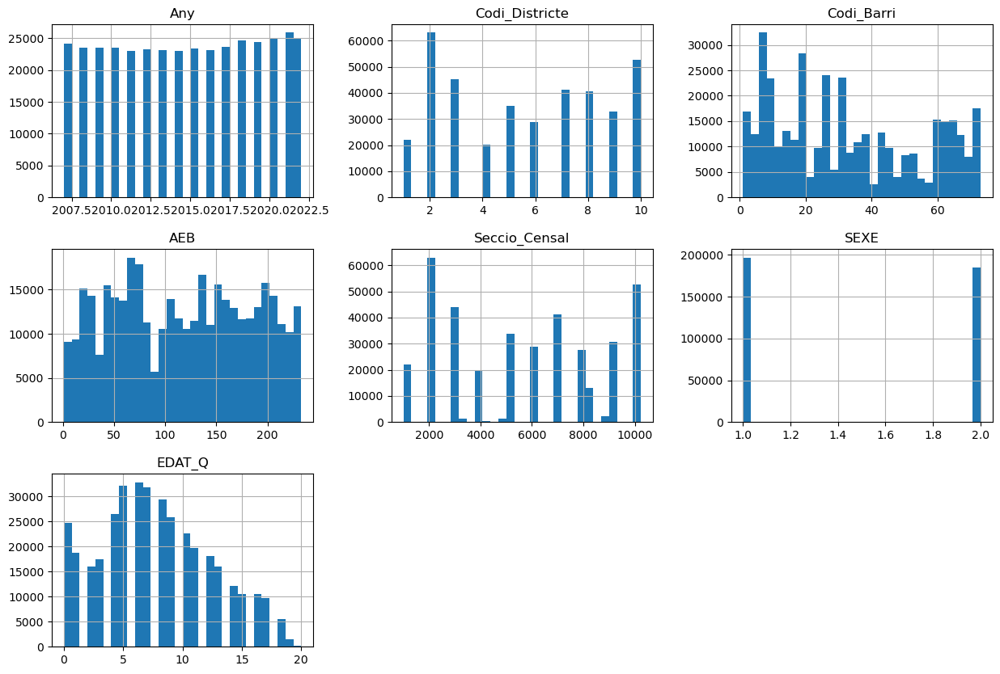

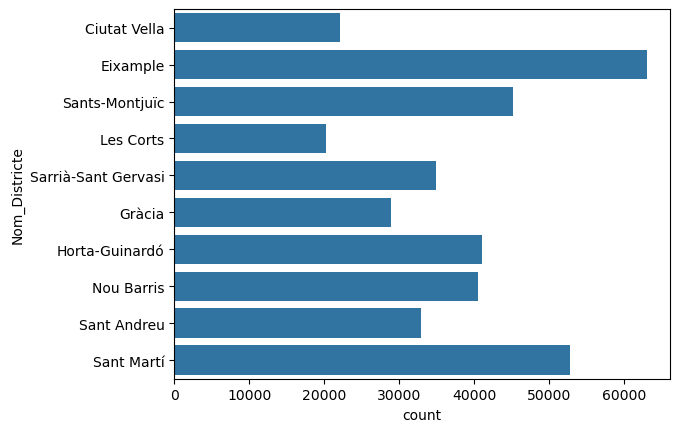

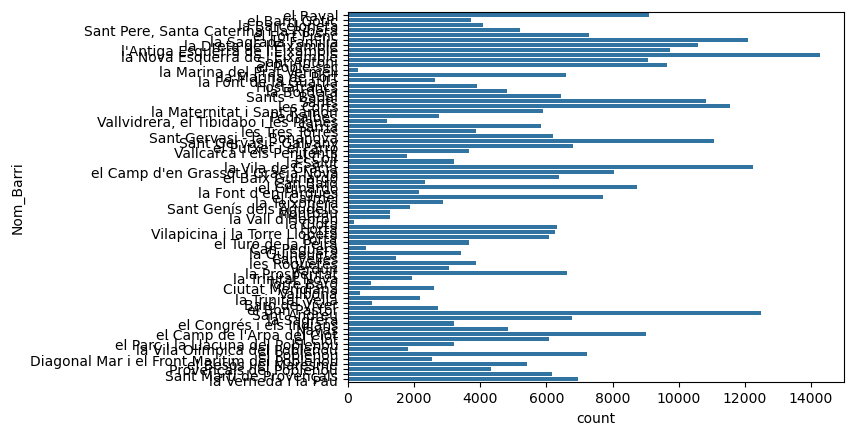

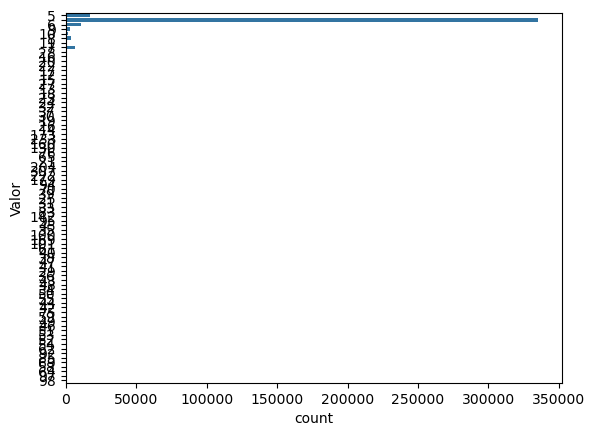

In [20]:
# Análisis de las variables:
df.hist(bins=30, figsize=(15, 10))
plt.show()

for column in df.select_dtypes(include=['object']).columns:
    sns.countplot(y=column, data=df)
    plt.show()

c:\Users\patry\anaconda3\envs\BaseGrafos\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


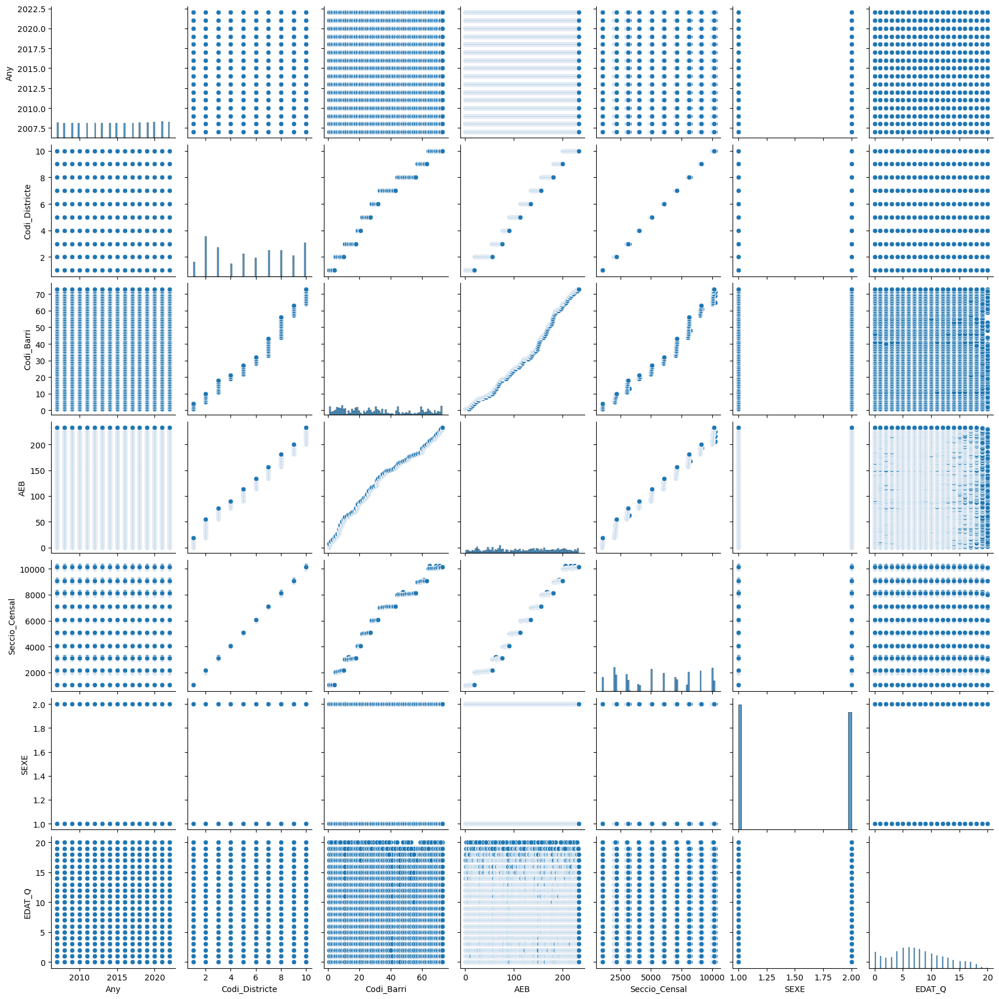

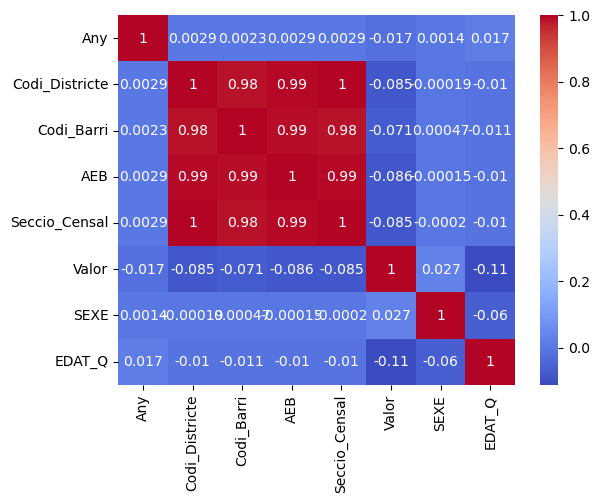

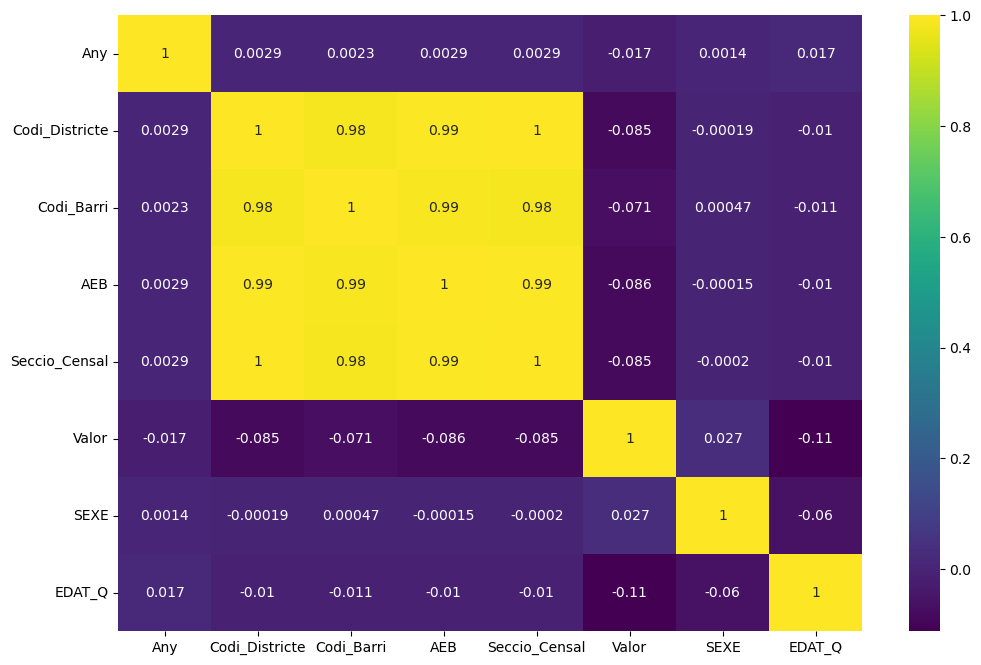

In [21]:
# Análisis de correlación:
sns.pairplot(df)
plt.show()

# Se quitan las variables no numéricas y se reemplazan los valores .. por 0 para poder realizar la correlación:
df=df.drop(columns=['Nom_Districte','Nom_Barri'])
df["Valor"]=df["Valor"].replace('..',0)

# Se define la matriz de correlación y se pinta:
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='viridis')
plt.show()


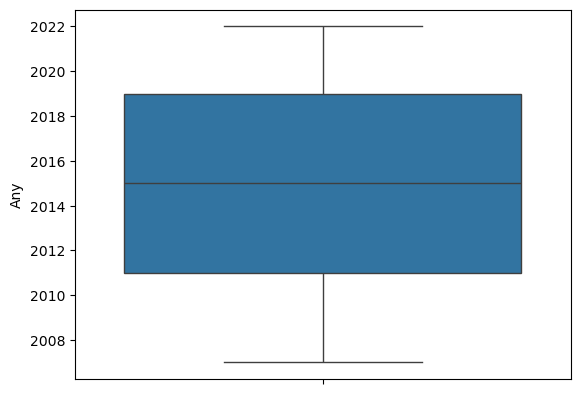

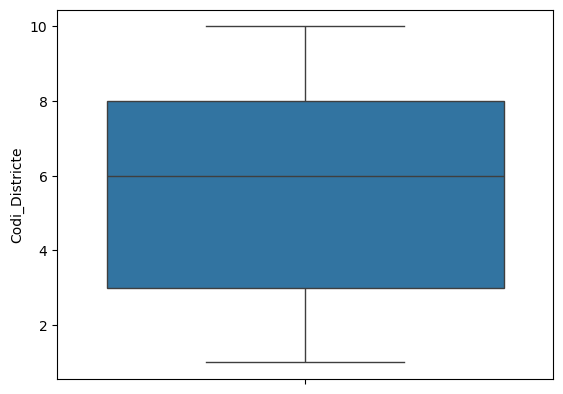

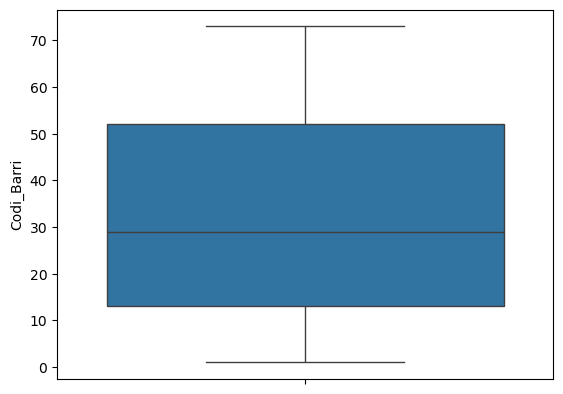

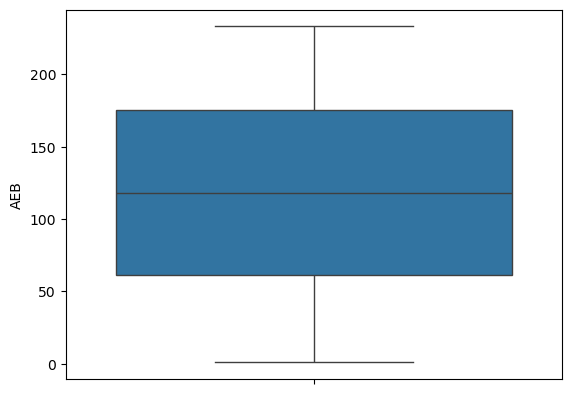

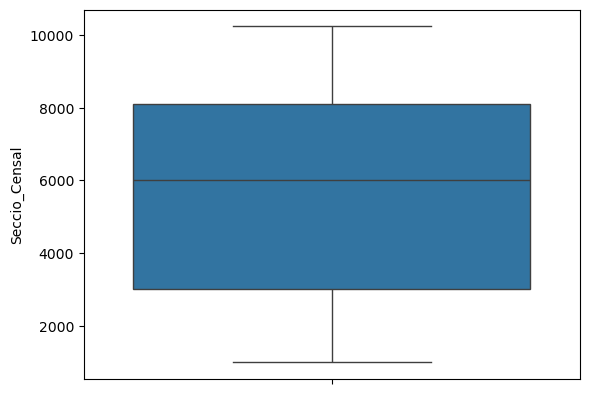

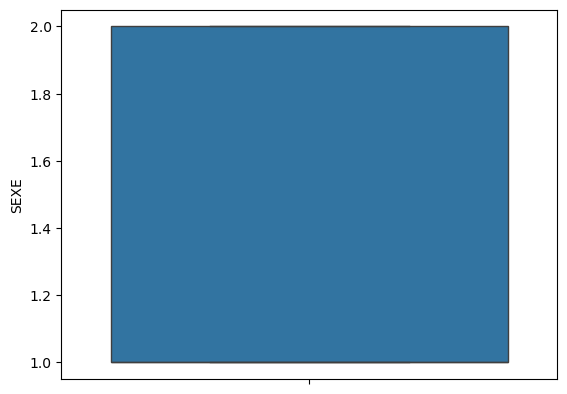

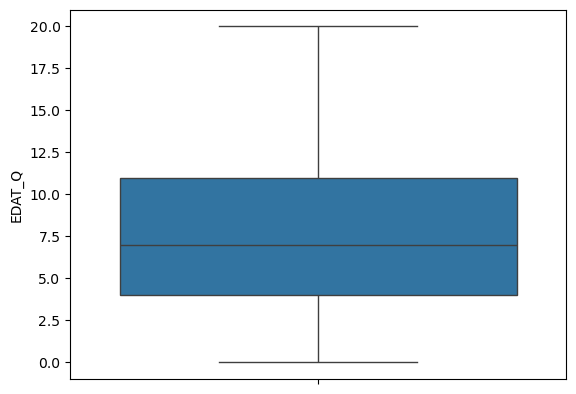

In [22]:
# Análisis de outliers:
for column in df.select_dtypes(include=[np.number]).columns:
    sns.boxplot(df[column])
    plt.show()

### Gini

In [23]:
# Lectura del csv de Gini:
df = pd.read_csv('../01-Ficheros Concatenados/gini.csv')

In [24]:
# Cabecera de los datos:
df.head()

,Any,Codi_Districte,Nom_Districte,Codi_Barri,Nom_Barri,Seccio_Censal,Index_Gini
0,2015,1,Ciutat Vella,1,el Raval,1,36.5
1,2015,1,Ciutat Vella,1,el Raval,2,40.4
2,2015,1,Ciutat Vella,1,el Raval,3,38.4
3,2015,1,Ciutat Vella,1,el Raval,4,40.4
4,2015,1,Ciutat Vella,1,el Raval,5,38.6


In [25]:
# Información de las columnas:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7476 entries, 0 to 7475
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Any             7476 non-null   int64 
 1   Codi_Districte  7476 non-null   int64 
 2   Nom_Districte   7476 non-null   object
 3   Codi_Barri      7476 non-null   int64 
 4   Nom_Barri       7476 non-null   object
 5   Seccio_Censal   7476 non-null   int64 
 6   Index_Gini      7476 non-null   object
dtypes: int64(4), object(3)
memory usage: 409.0+ KB


In [26]:
# Descripción del dataframe:
df.describe()

,Any,Codi_Districte,Codi_Barri,Seccio_Censal
count,7476.000000,7476.000000,7476.000000,7476.000000
mean,2018.000000,5.723783,33.246255,60.645131
std,2.000134,2.937353,21.884200,41.552854
min,2015.000000,1.000000,1.000000,1.000000
25%,2016.000000,3.000000,13.000000,27.750000
50%,2018.000000,6.000000,31.000000,54.000000
75%,2020.000000,8.000000,52.000000,87.000000
max,2021.000000,10.000000,73.000000,237.000000


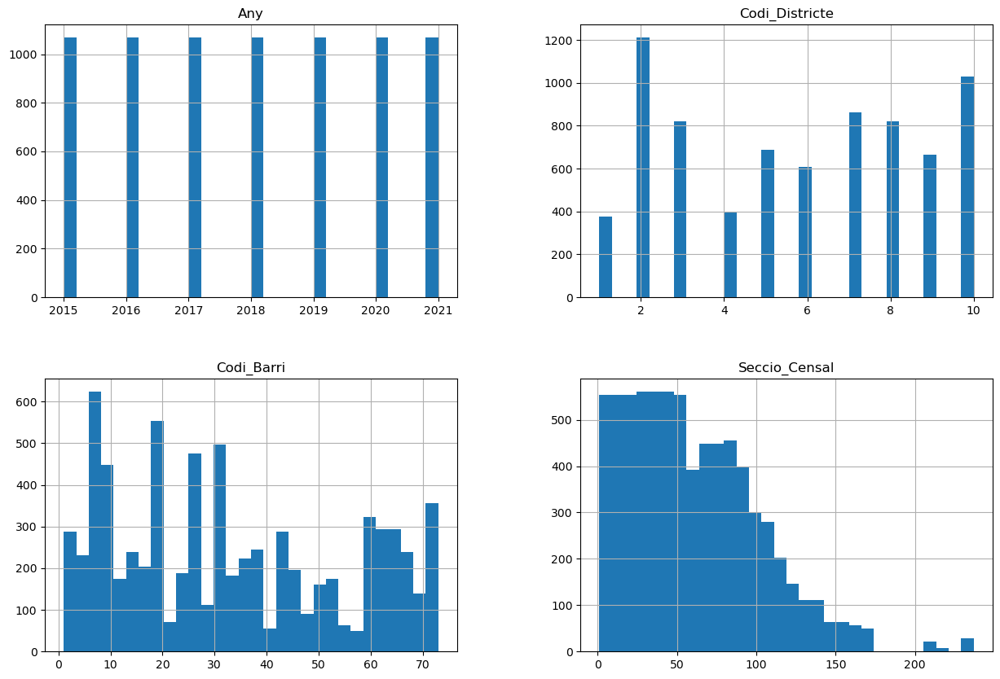

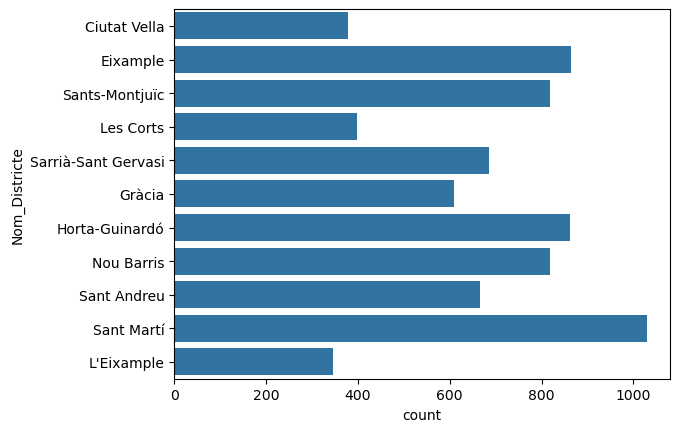

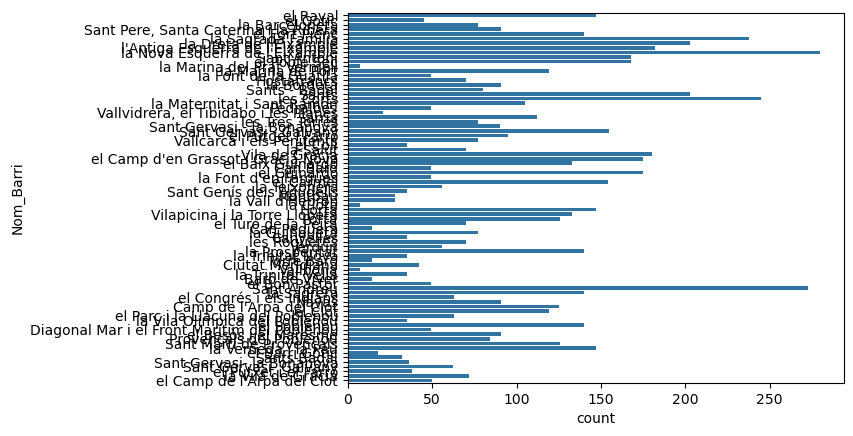

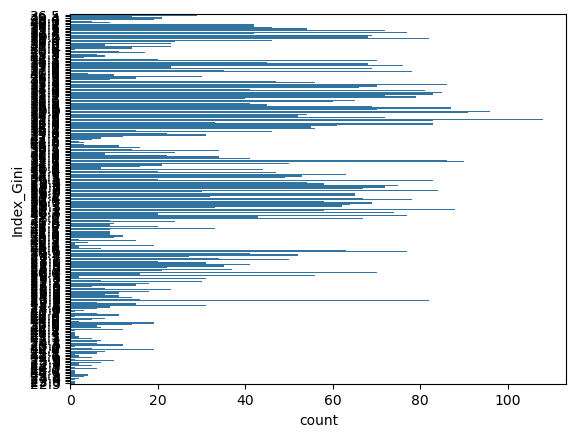

In [27]:
# Análisis de las variables:
df.hist(bins=30, figsize=(15, 10))
plt.show()

for column in df.select_dtypes(include=['object']).columns:
    sns.countplot(y=column, data=df)
    plt.show()

c:\Users\patry\anaconda3\envs\BaseGrafos\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


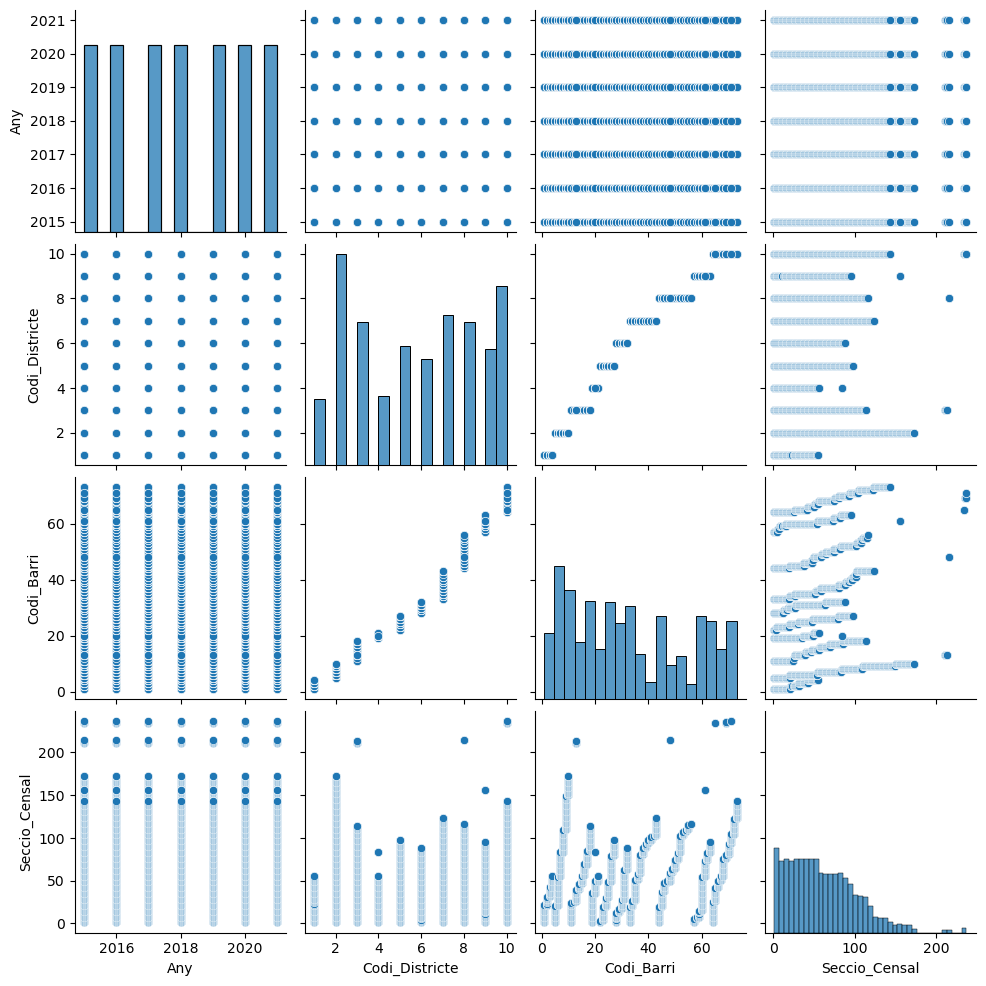

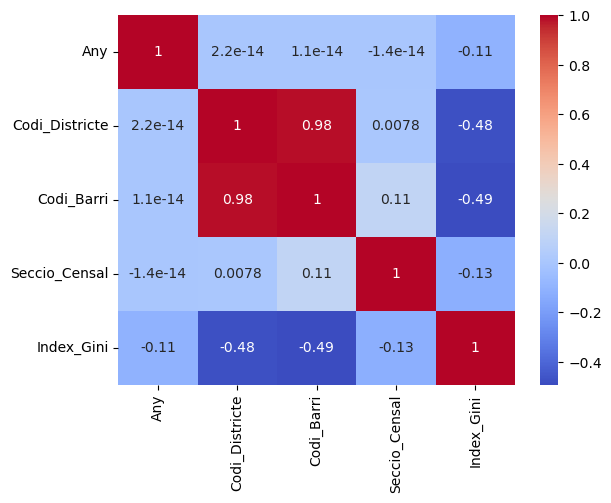

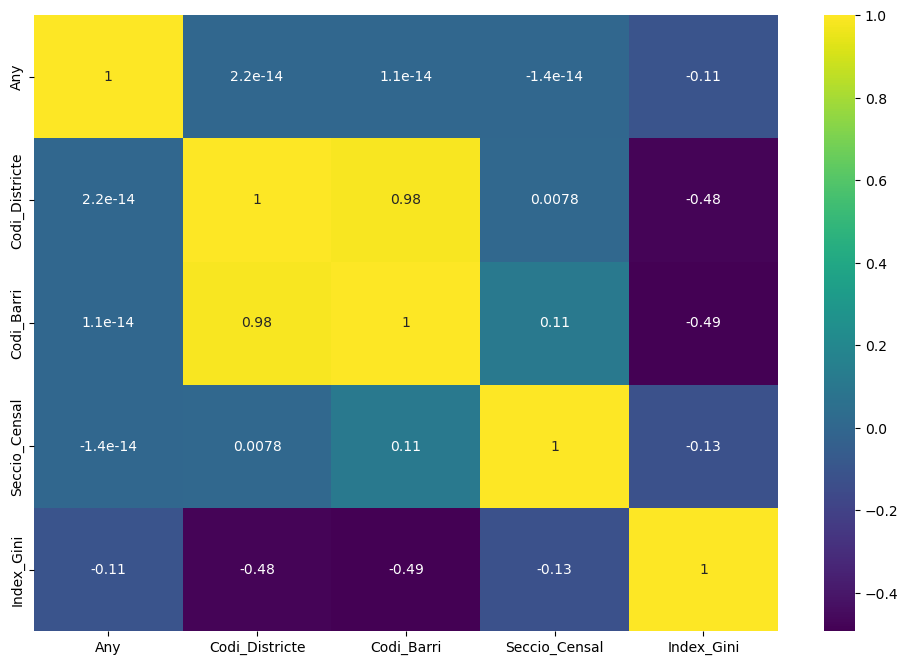

In [28]:
# Análisis de correlación:
sns.pairplot(df)
plt.show()

# Se quitan las variables no numéricas para poder realizar la correlación:
df=df.drop(columns=['Nom_Districte','Nom_Barri'])
df['Index_Gini']=df['Index_Gini'].replace('-',0)
df['Index_Gini']=df['Index_Gini'].replace('.',0)
df['Index_Gini']=df['Index_Gini'].astype(float)
# Se define la matriz de correlación y se pinta:
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='viridis')
plt.show()

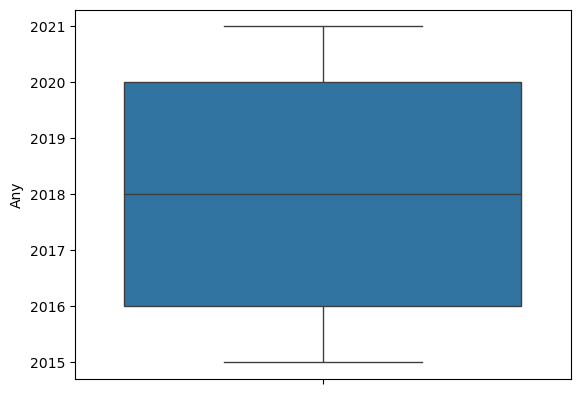

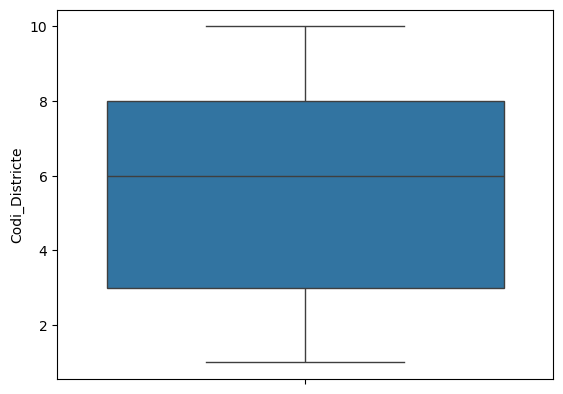

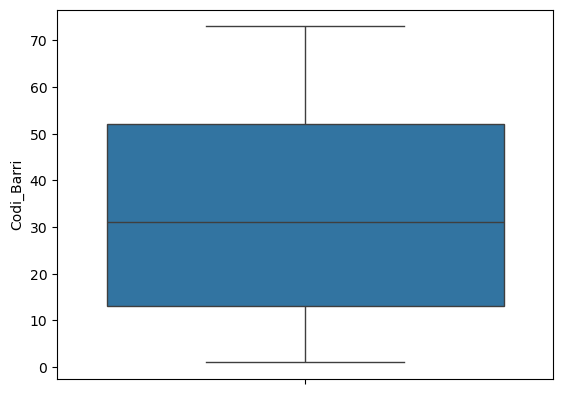

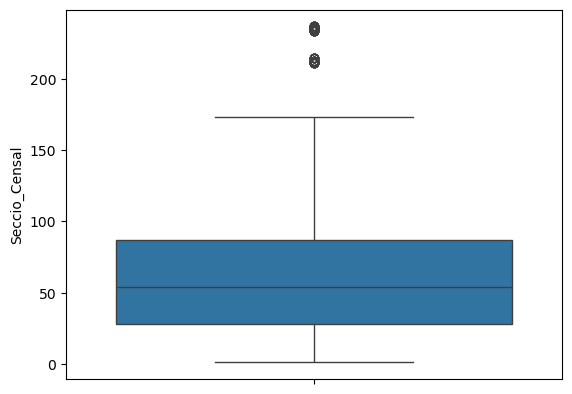

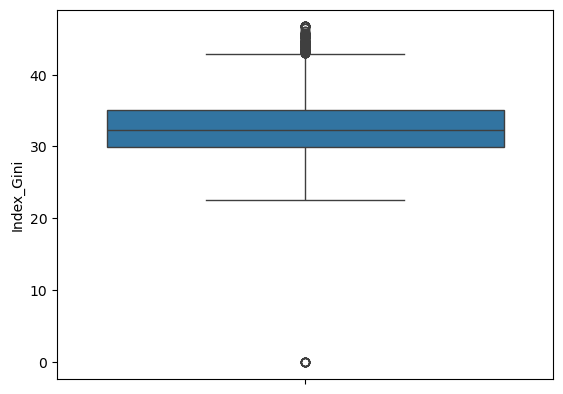

In [29]:
# Análisis de outliers:
for column in df.select_dtypes(include=[np.number]).columns:
    sns.boxplot(df[column])
    plt.show()

### Incidentes:

In [30]:
# Lectura del csv de defunciones:
df = pd.read_csv('../01-Ficheros Concatenados/incidentes.csv')

C:\Users\patry\AppData\Local\Temp\ipykernel_9568\1426764252.py:2: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('../01-Ficheros Concatenados/incidentes.csv')


In [31]:
# Cabecera de los datos:
df.head()

,Codi_Incident,Descripcio_Incident,Codi_districte,Nom_districte,Codi_barri,Nom_barri,NK_Any,Mes_any,Nom_mes,Numero_incidents_GUB
0,210,ACCIDENTS DE TRÀNSIT SENSE FERITS ...,7.0,Horta-Guinardó,35.0,el Guinardó,2010.0,7.0,Juliol,9.0
1,222,INFRACCIONS EN MOVIMENT ...,10.0,Sant Martí,66.0,el Parc i la Llacuna del Poblenou,2010.0,7.0,Juliol,17.0
2,410,ACTIVITATS MOLESTES EN ESPAIS PÚBLICS ...,1.0,Ciutat Vella,1.0,el Raval,2010.0,7.0,Juliol,349.0
3,420,INCIDÈNCIES DE LOCALS ...,1.0,Ciutat Vella,2.0,el Barri Gòtic,2010.0,7.0,Juliol,50.0
4,420,INCIDÈNCIES DE LOCALS ...,1.0,Ciutat Vella,3.0,la Barceloneta,2010.0,7.0,Juliol,27.0


In [32]:
# Información de las columnas:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 484421 entries, 0 to 484420
Data columns (total 10 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Codi_Incident         484421 non-null  object 
 1   Descripcio_Incident   466523 non-null  object 
 2   Codi_districte        466523 non-null  float64
 3   Nom_districte         466523 non-null  object 
 4   Codi_barri            466524 non-null  float64
 5   Nom_barri             466523 non-null  object 
 6   NK_Any                466523 non-null  float64
 7   Mes_any               466524 non-null  object 
 8   Nom_mes               466523 non-null  object 
 9   Numero_incidents_GUB  466523 non-null  float64
dtypes: float64(4), object(6)
memory usage: 37.0+ MB


In [33]:
# Descripción del dataframe:
df.describe()

,Codi_districte,Codi_barri,NK_Any,Numero_incidents_GUB
count,466523.000000,466524.000000,466523.000000,466523.000000
mean,5.850295,34.537683,2016.878120,10.986412
std,3.071442,22.450757,4.048407,23.530691
min,-1.000000,-1.000000,2010.000000,1.000000
25%,3.000000,14.000000,2013.000000,1.000000
50%,6.000000,32.000000,2017.000000,4.000000
75%,8.000000,55.000000,2021.000000,10.000000
max,10.000000,73.000000,2023.000000,919.000000


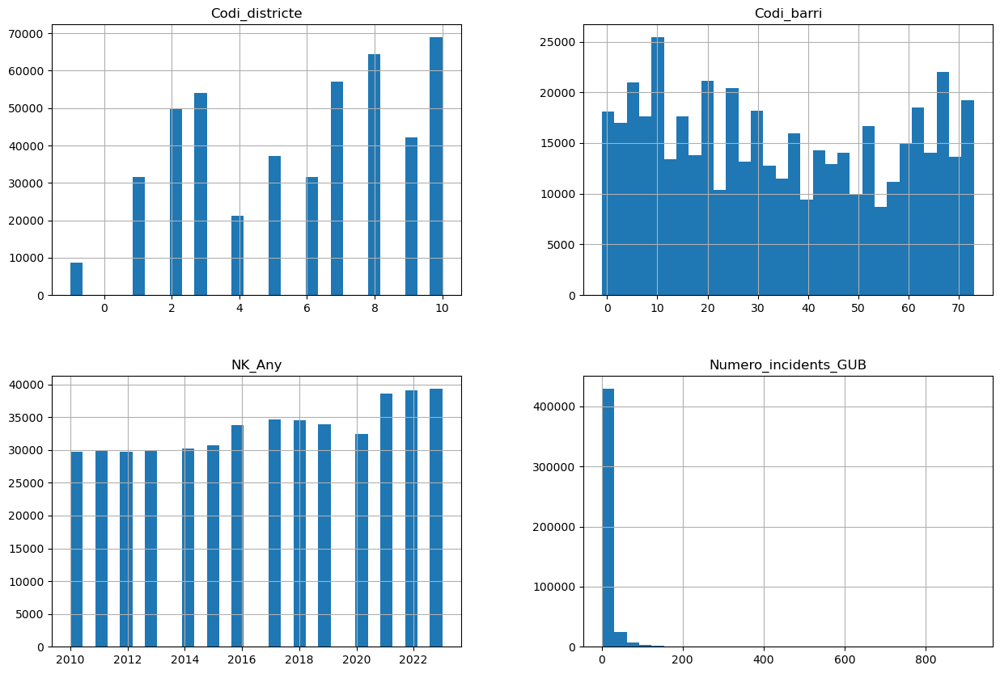

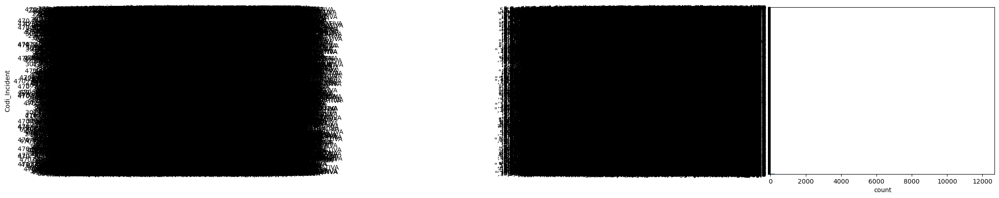

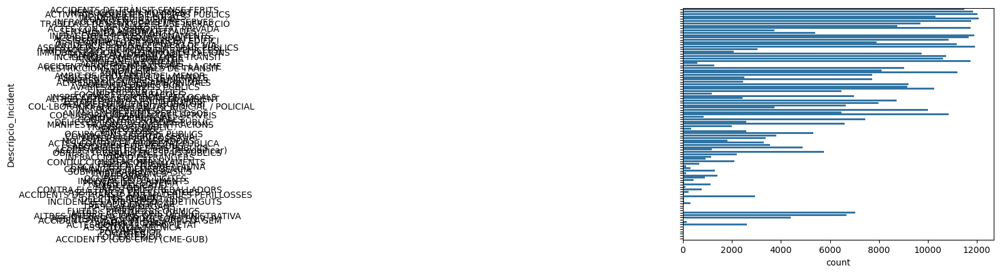

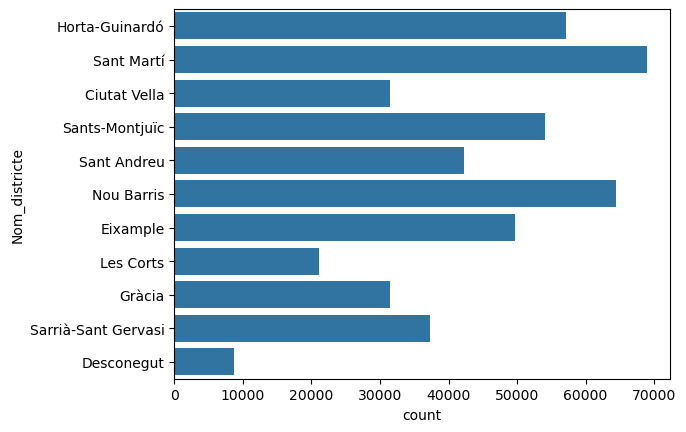

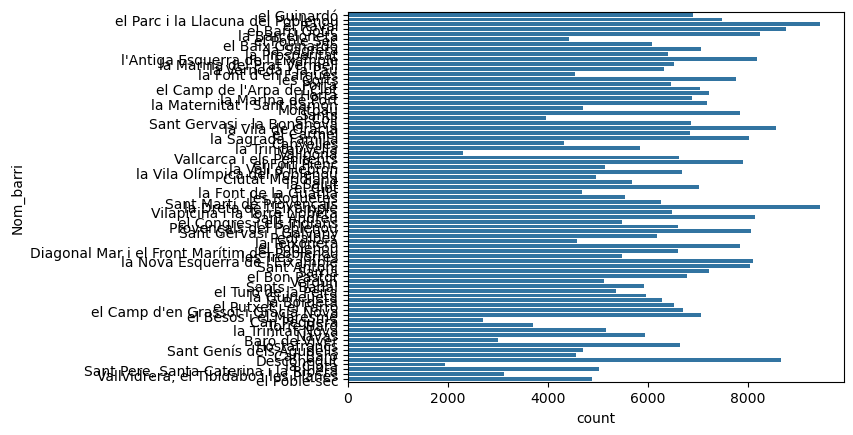

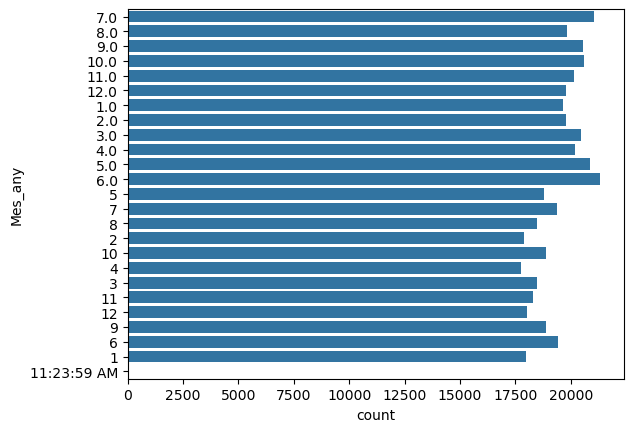

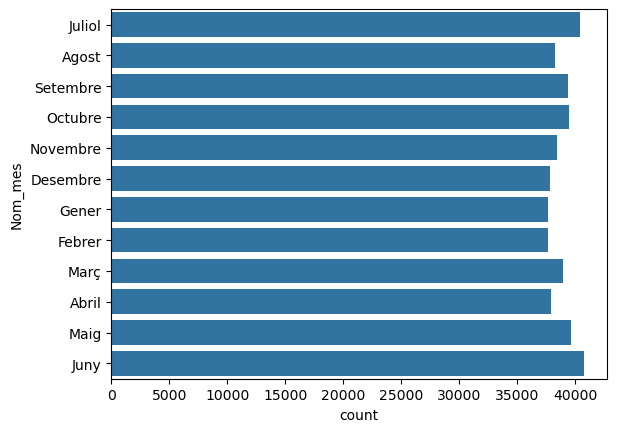

In [34]:
# Análisis de las variables:
df.hist(bins=30, figsize=(15, 10))
plt.show()

for column in df.select_dtypes(include=['object']).columns:
    sns.countplot(y=column, data=df)
    plt.show()

c:\Users\patry\anaconda3\envs\BaseGrafos\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


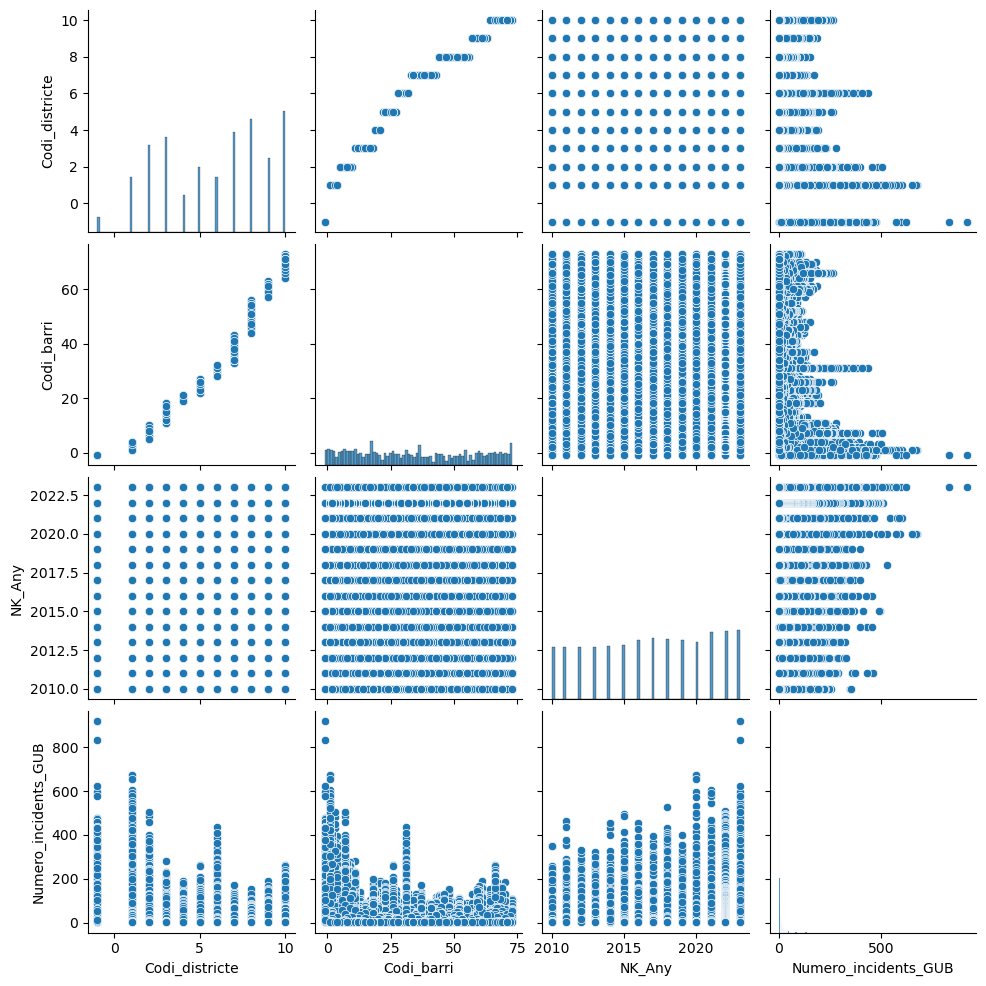

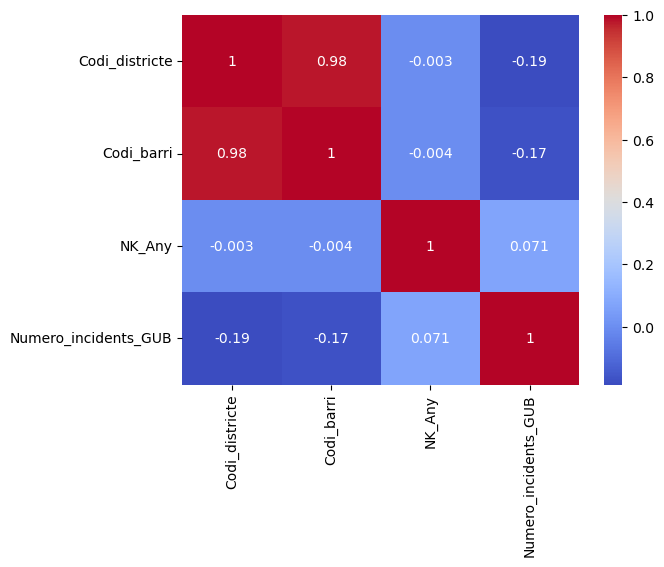

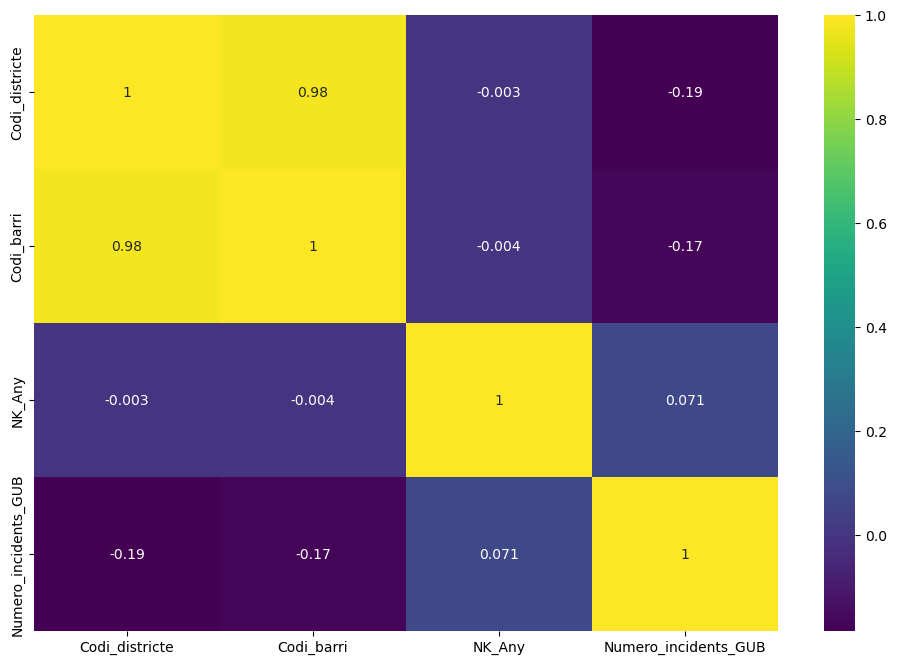

In [35]:
# Análisis de correlación:
sns.pairplot(df)
plt.show()

# Se quitan las variables no numéricas para poder realizar la correlación:
df=df.drop(columns=['Nom_districte','Nom_barri','Codi_Incident','Descripcio_Incident','Mes_any','Nom_mes'])


# Se define la matriz de correlación y se pinta:
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='viridis')
plt.show()

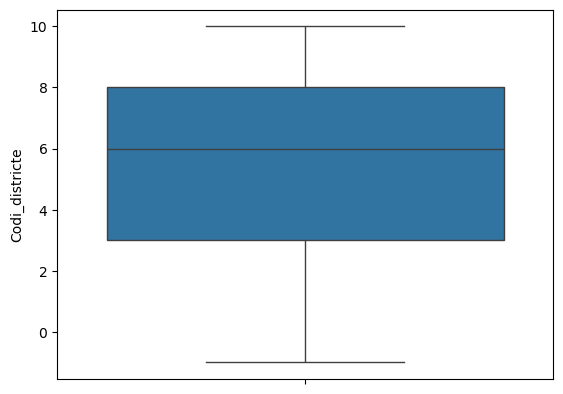

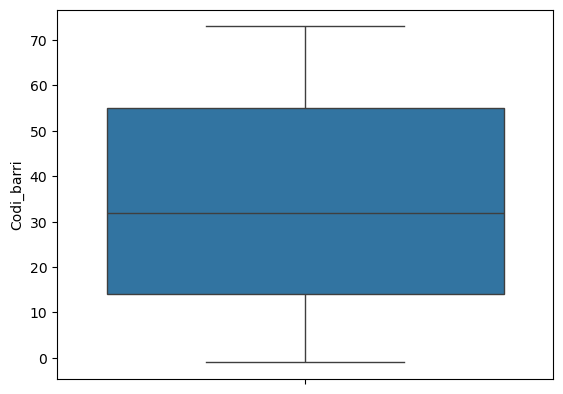

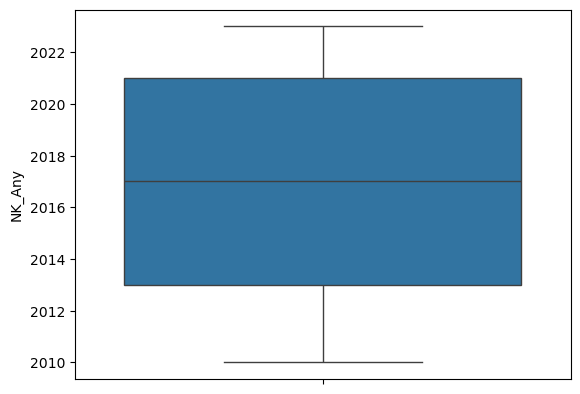

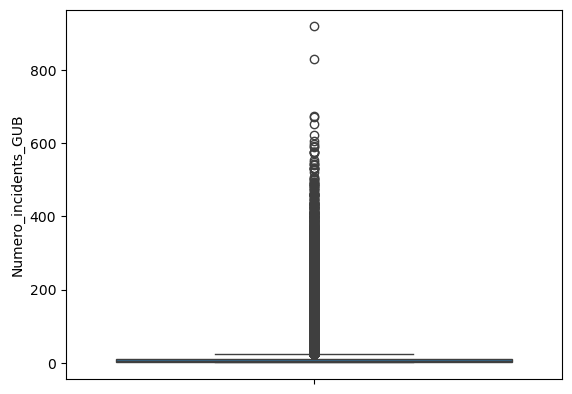

In [36]:
# Análisis de outliers:
for column in df.select_dtypes(include=[np.number]).columns:
    sns.boxplot(df[column])
    plt.show()

### Inmigrantes

In [37]:
# Lectura del csv de inmigrantes:
df = pd.read_csv('../01-Ficheros Concatenados/inmigrantes.csv')

In [38]:
# Cabecera de los datos:
df.head()

,Any,Codi_Districte,Nom_Districte,Codi_Barri,Nom_Barri,AEB,Seccio_Censal,Valor,SEXE,EDAT_Q
0,2007,1,Ciutat Vella,1,el Raval,1,1001,..,1,0
1,2007,1,Ciutat Vella,1,el Raval,1,1001,..,1,1
2,2007,1,Ciutat Vella,1,el Raval,1,1001,..,1,2
3,2007,1,Ciutat Vella,1,el Raval,1,1001,..,1,3
4,2007,1,Ciutat Vella,1,el Raval,1,1001,7,1,4


In [39]:
# Información de las columnas:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396808 entries, 0 to 396807
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   Any             396808 non-null  int64 
 1   Codi_Districte  396808 non-null  int64 
 2   Nom_Districte   396808 non-null  object
 3   Codi_Barri      396808 non-null  int64 
 4   Nom_Barri       396808 non-null  object
 5   AEB             396808 non-null  int64 
 6   Seccio_Censal   396808 non-null  int64 
 7   Valor           396808 non-null  object
 8   SEXE            396808 non-null  int64 
 9   EDAT_Q          396808 non-null  int64 
dtypes: int64(7), object(3)
memory usage: 30.3+ MB


In [40]:
# Descripción del dataframe:
df.describe()

,Any,Codi_Districte,Codi_Barri,AEB,Seccio_Censal,SEXE,EDAT_Q
count,396808.000000,396808.000000,396808.000000,396808.000000,396808.000000,396808.000000,396808.000000
mean,2014.617556,5.613901,32.520352,117.426002,5674.475260,1.488231,7.004788
std,4.631400,2.967497,22.052846,66.073461,2968.227802,0.499862,4.403166
min,2007.000000,1.000000,1.000000,1.000000,1001.000000,1.000000,0.000000
25%,2011.000000,3.000000,12.000000,60.000000,3025.000000,1.000000,4.000000
50%,2015.000000,6.000000,29.000000,118.000000,6013.000000,1.000000,7.000000
75%,2019.000000,8.000000,52.000000,174.000000,8087.250000,2.000000,10.000000
max,2022.000000,10.000000,73.000000,233.000000,10237.000000,2.000000,21.000000


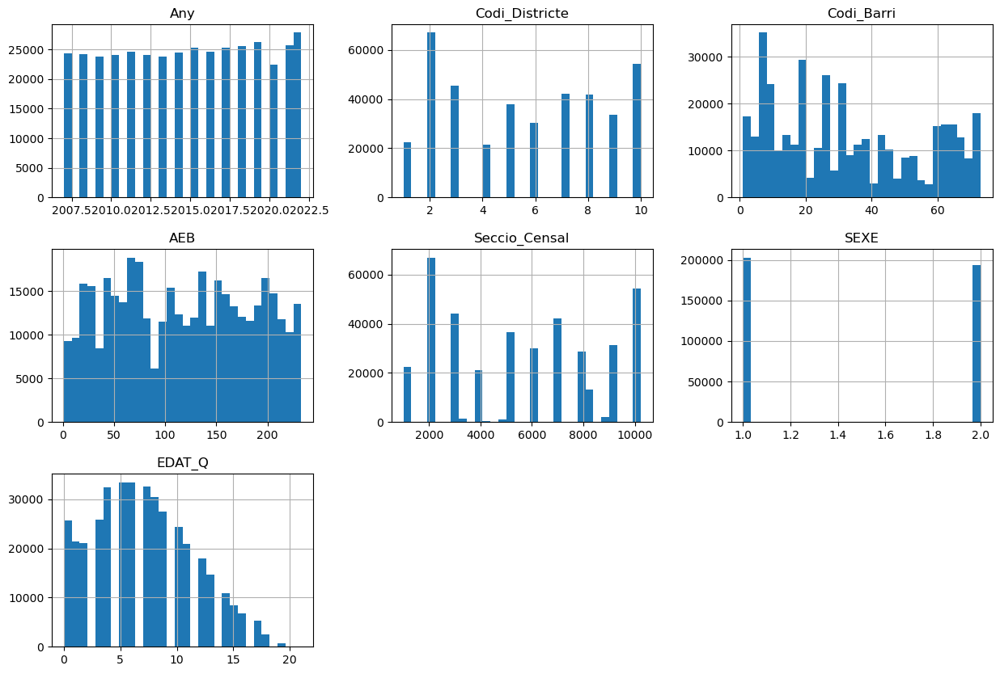

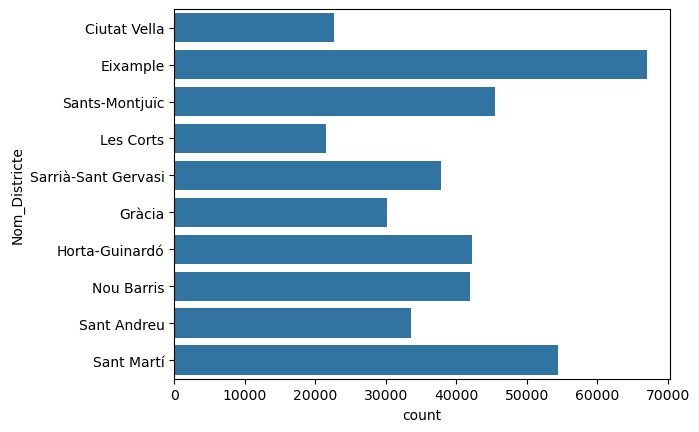

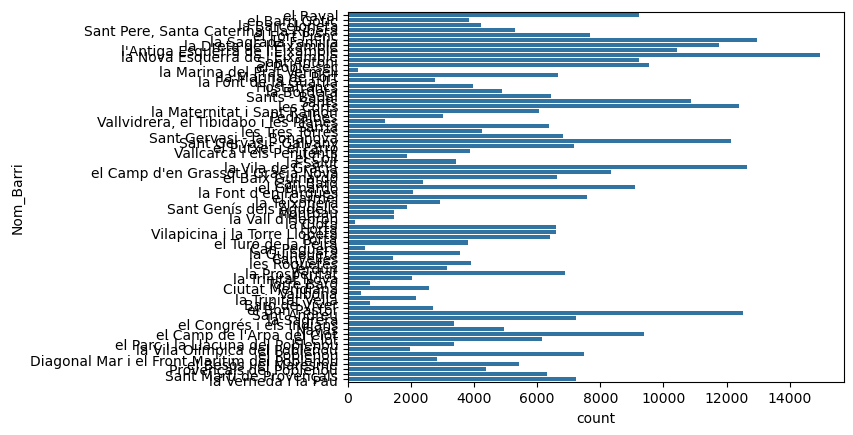

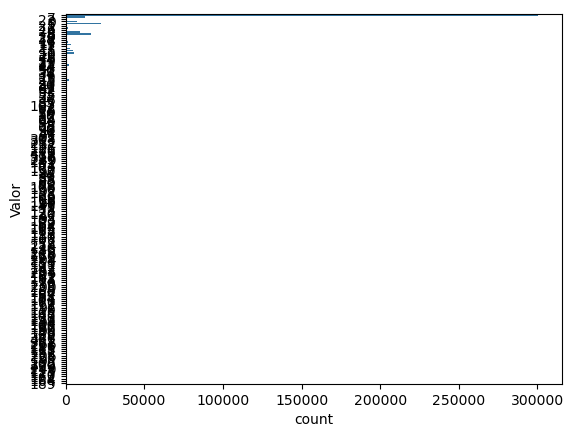

In [41]:
# Análisis de las variables:
df.hist(bins=30, figsize=(15, 10))
plt.show()

for column in df.select_dtypes(include=['object']).columns:
    sns.countplot(y=column, data=df)
    plt.show()
	

c:\Users\patry\anaconda3\envs\BaseGrafos\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


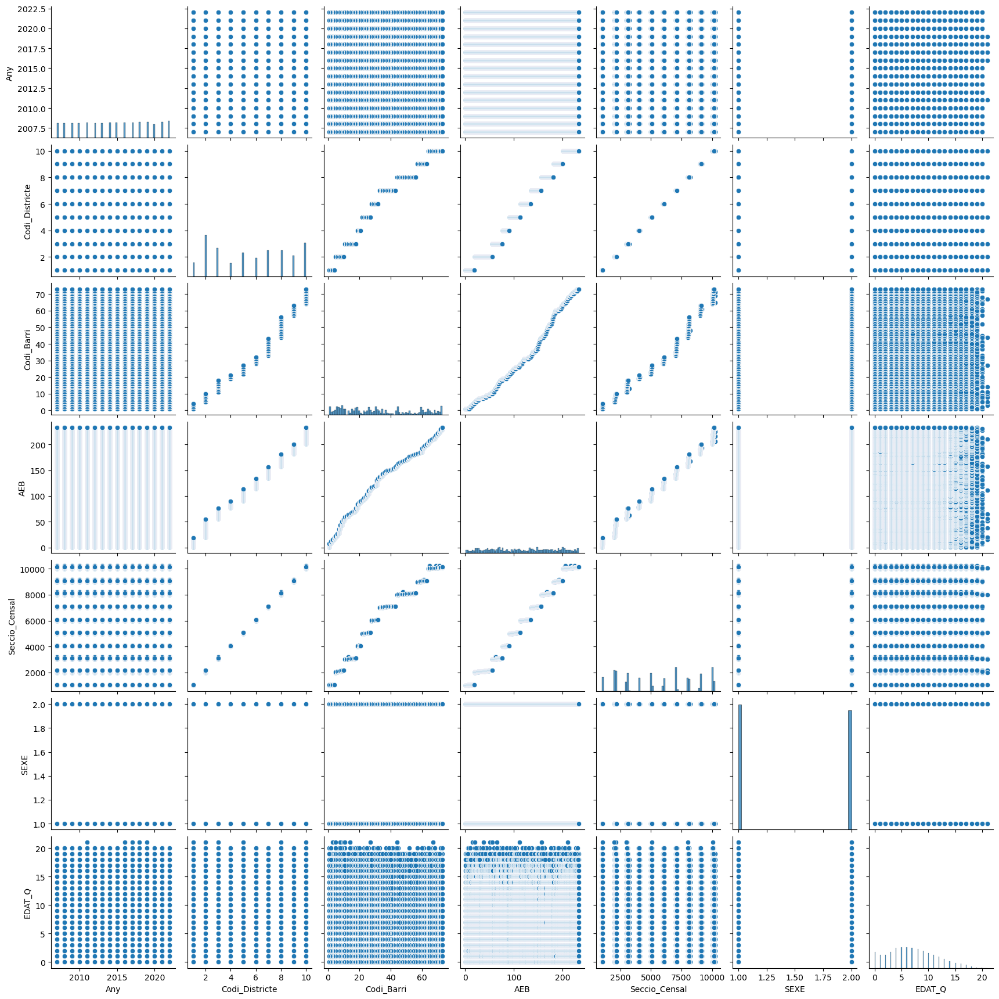

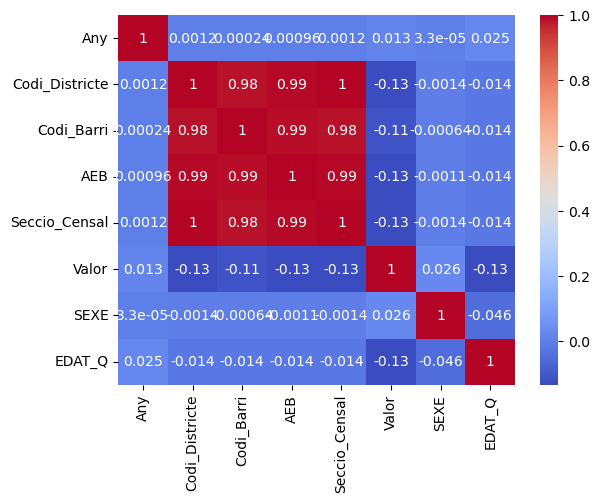

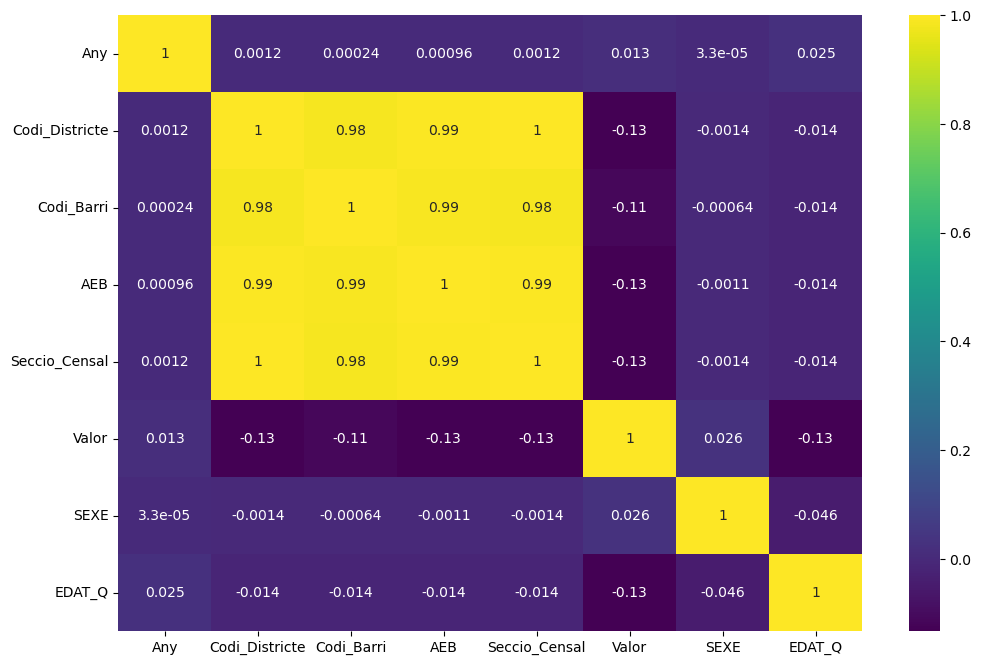

In [42]:
# Análisis de correlación:
sns.pairplot(df)
plt.show()

# Se quitan las variables no numéricas y se reemplazan los valores .. por 0 para poder realizar la correlación:
df=df.drop(columns=['Nom_Districte','Nom_Barri'])
df['Valor']=df['Valor'].replace('..',0)

# Se define la matriz de correlación y se pinta:
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='viridis')
plt.show()

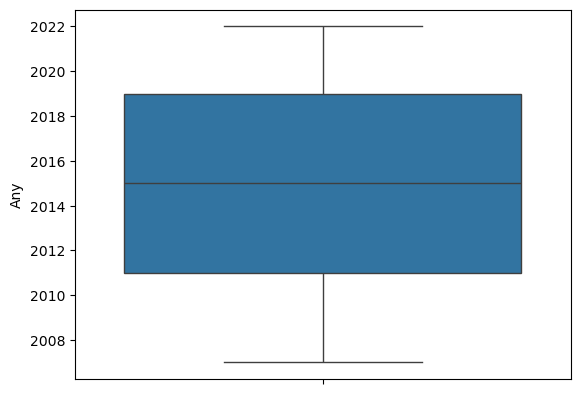

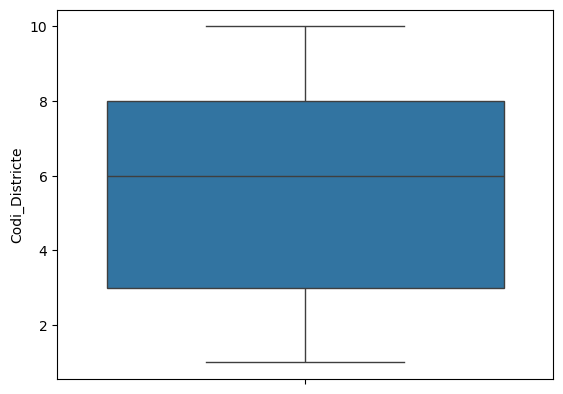

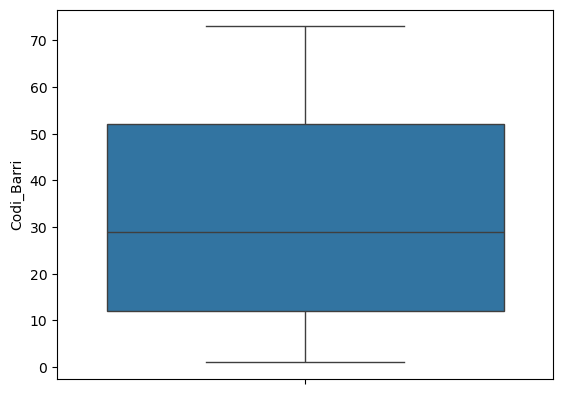

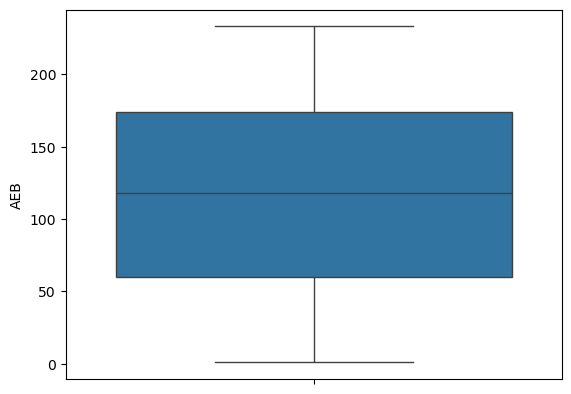

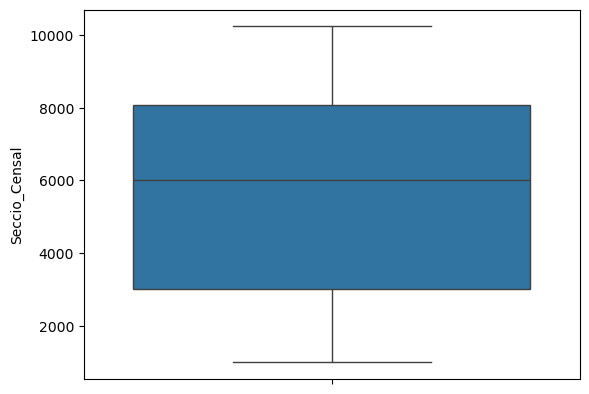

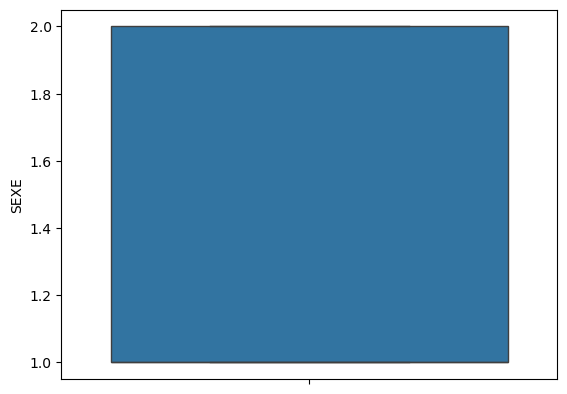

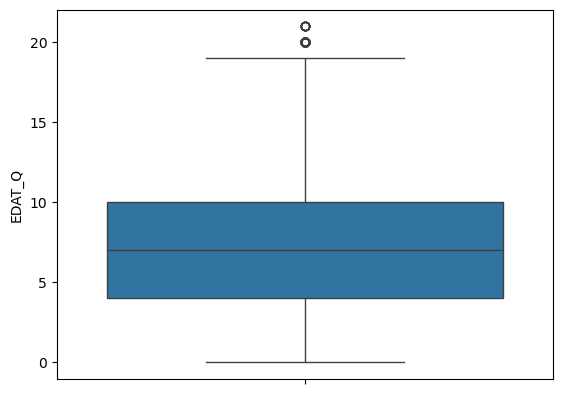

In [43]:
# Análisis de outliers:
for column in df.select_dtypes(include=[np.number]).columns:
    sns.boxplot(df[column])
    plt.show()

### Nacimientos:

In [44]:
# Lectura del csv de nacimientos:
df = pd.read_csv('../01-Ficheros Concatenados/nacimientos.csv')

In [45]:
# Cabecera de los datos:
df.head()

,Any,Codi_Districte,Nom_Districte,Codi_Barri,Nom_Barri,AEB,Seccio_Censal,Valor,NACIONALITAT_PAIS,NACIONALITAT_CONTINENT,SEXE
0,2007,1,Ciutat Vella,1,el Raval,1,1001,..,58,4,1
1,2007,1,Ciutat Vella,1,el Raval,1,1001,6,58,4,2
2,2007,1,Ciutat Vella,1,el Raval,1,1001,..,174,4,2
3,2007,1,Ciutat Vella,1,el Raval,1,1001,..,179,4,2
4,2007,1,Ciutat Vella,1,el Raval,1,1001,..,135,1,2


In [46]:
# Información de las columnas:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76409 entries, 0 to 76408
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Any                     76409 non-null  int64 
 1   Codi_Districte          76409 non-null  int64 
 2   Nom_Districte           76409 non-null  object
 3   Codi_Barri              76409 non-null  int64 
 4   Nom_Barri               76409 non-null  object
 5   AEB                     76409 non-null  int64 
 6   Seccio_Censal           76409 non-null  int64 
 7   Valor                   76409 non-null  object
 8   NACIONALITAT_PAIS       76409 non-null  int64 
 9   NACIONALITAT_CONTINENT  76409 non-null  int64 
 10  SEXE                    76409 non-null  int64 
dtypes: int64(8), object(3)
memory usage: 6.4+ MB


In [47]:
# Descripción del dataframe:
df.describe()

,Any,Codi_Districte,Codi_Barri,AEB,Seccio_Censal,NACIONALITAT_PAIS,NACIONALITAT_CONTINENT,SEXE
count,76409.000000,76409.000000,76409.000000,76409.000000,76409.000000,76409.000000,76409.000000,76409.000000
mean,2014.442566,5.576005,32.452316,116.359002,5635.745841,92.333717,3.525619,1.506432
std,4.642488,3.090897,22.864141,69.187605,3093.903468,61.956554,15.311560,0.499962
min,2007.000000,1.000000,1.000000,1.000000,1001.000000,1.000000,1.000000,1.000000
25%,2010.000000,3.000000,11.000000,56.000000,3003.000000,58.000000,3.000000,1.000000
50%,2014.000000,6.000000,31.000000,121.000000,6030.000000,58.000000,4.000000,2.000000
75%,2019.000000,8.000000,52.000000,177.000000,8102.000000,135.000000,4.000000,2.000000
max,2022.000000,10.000000,73.000000,233.000000,10237.000000,999.000000,999.000000,2.000000


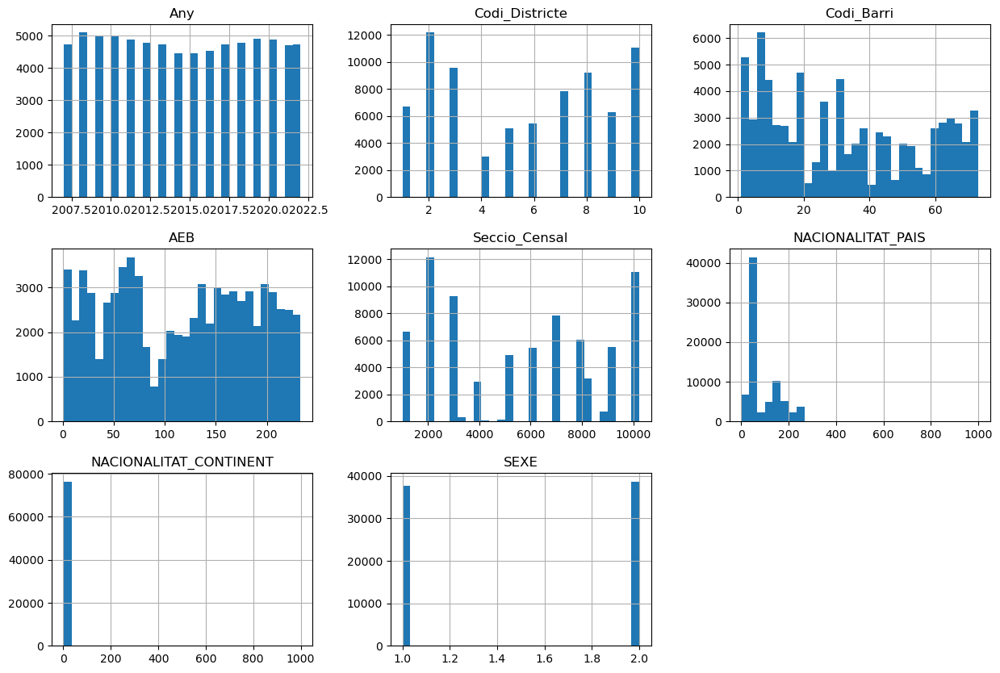

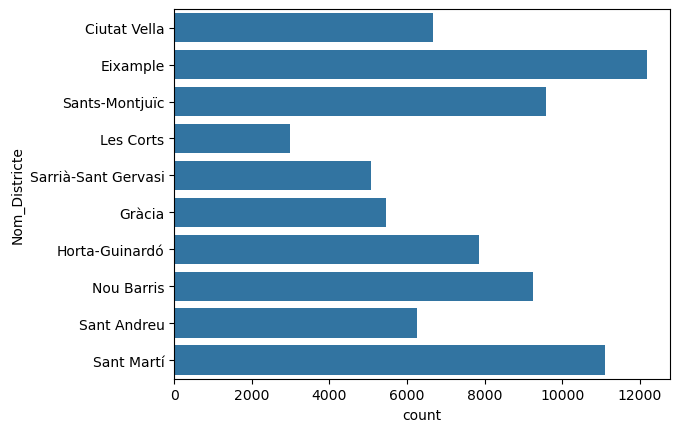

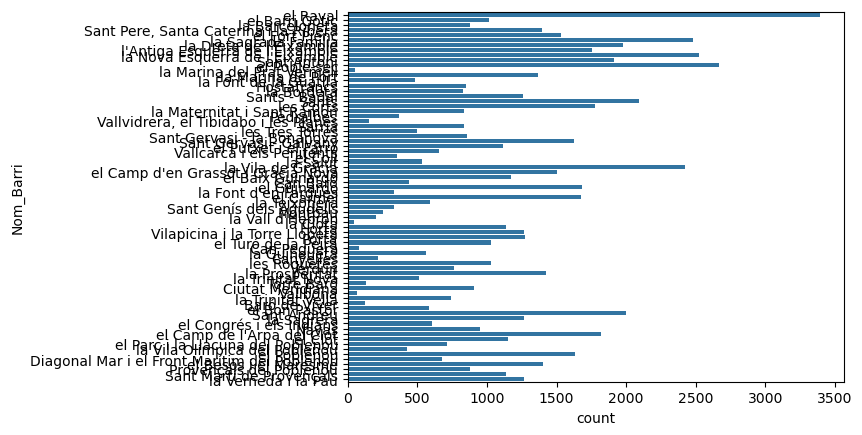

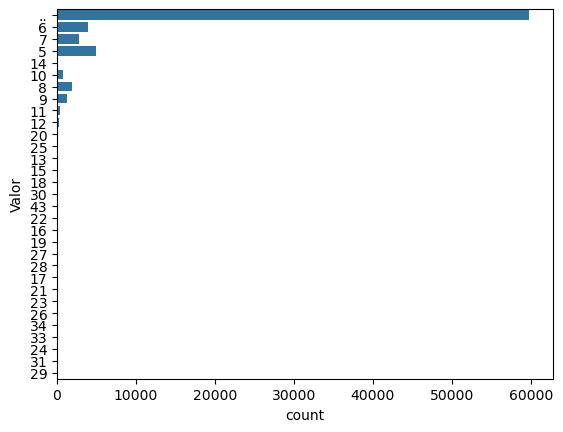

In [48]:
# Análisis de las variables:
df.hist(bins=30, figsize=(15, 10))
plt.show()

for column in df.select_dtypes(include=['object']).columns:
    sns.countplot(y=column, data=df)
    plt.show()

c:\Users\patry\anaconda3\envs\BaseGrafos\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


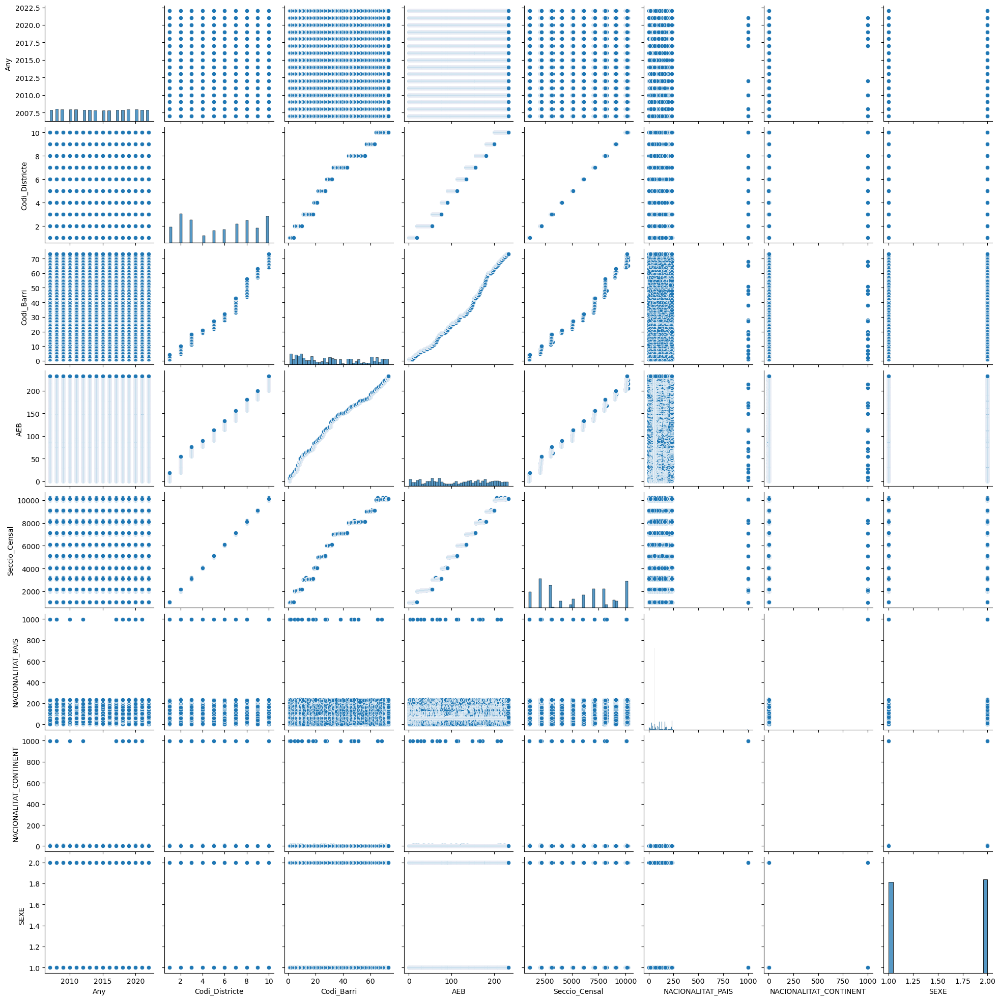

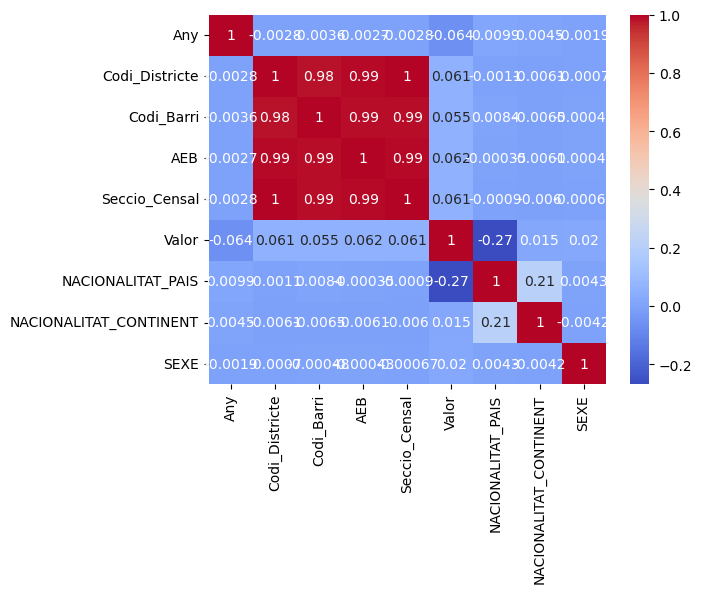

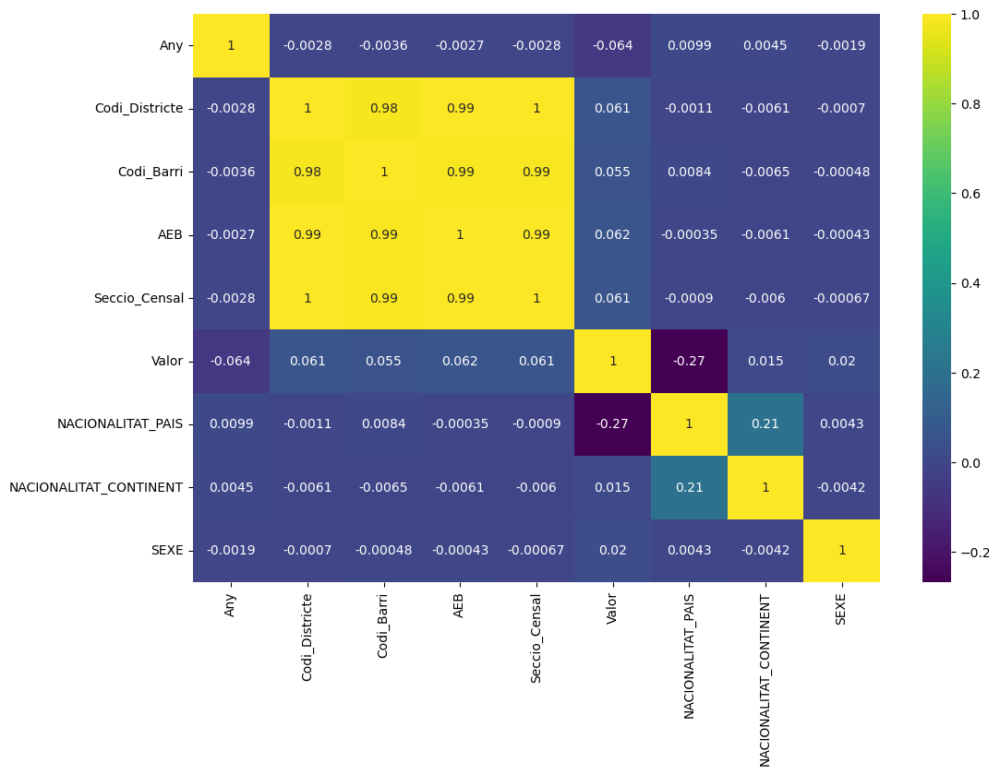

In [49]:
# Análisis de correlación:
sns.pairplot(df)
plt.show()

# Se quitan las variables no numéricas y se reemplazan los valores .. por 0 para poder realizar la correlación:
df=df.drop(columns=['Nom_Districte','Nom_Barri'])
df['Valor']=df['Valor'].replace('..',0)

# Se define la matriz de correlación y se pinta:
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='viridis')
plt.show()

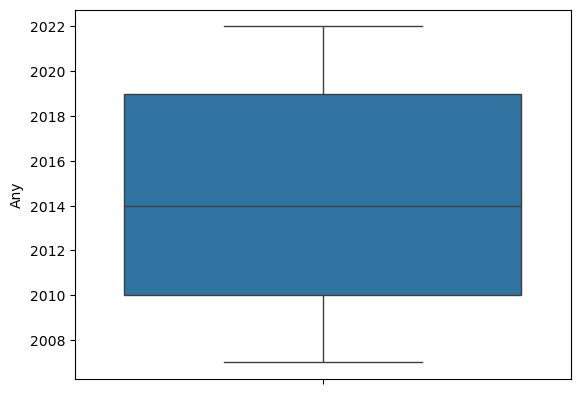

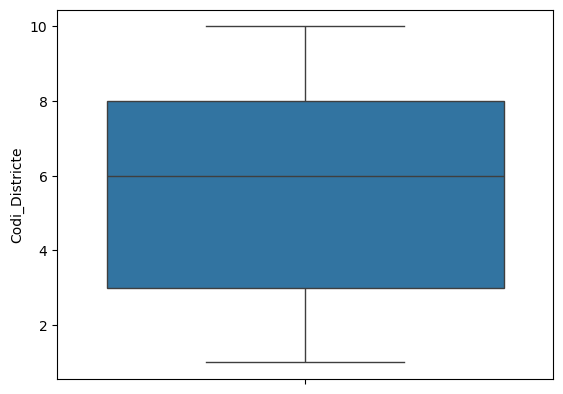

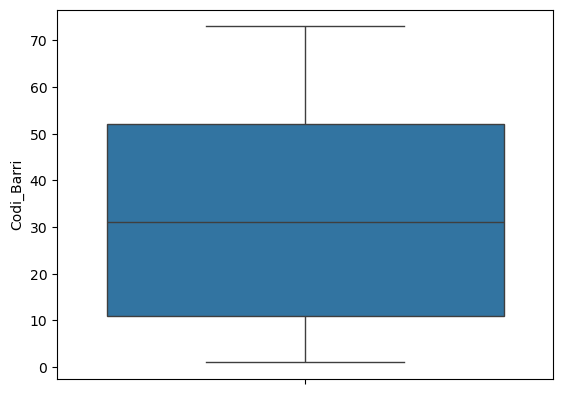

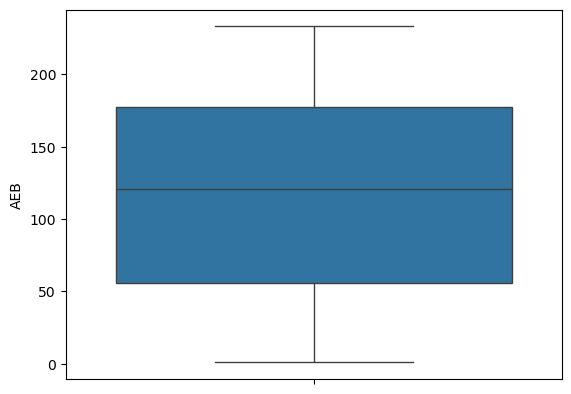

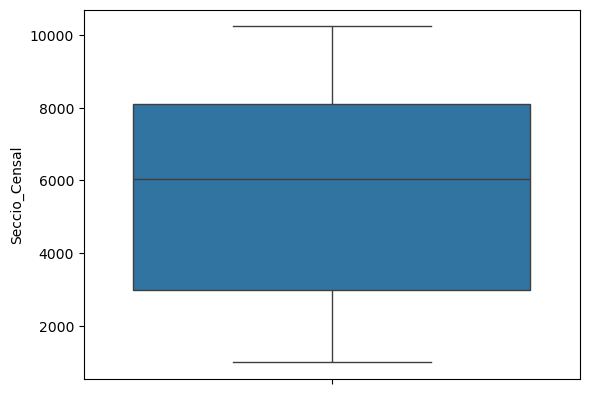

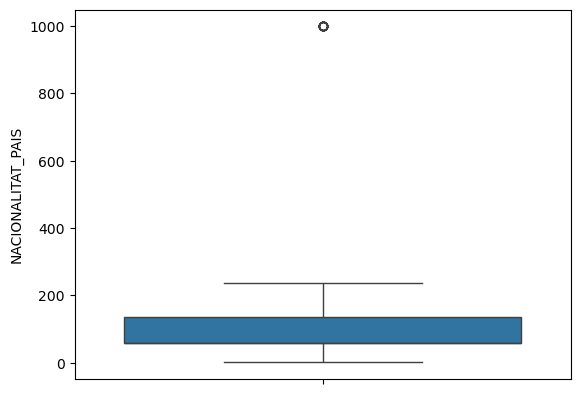

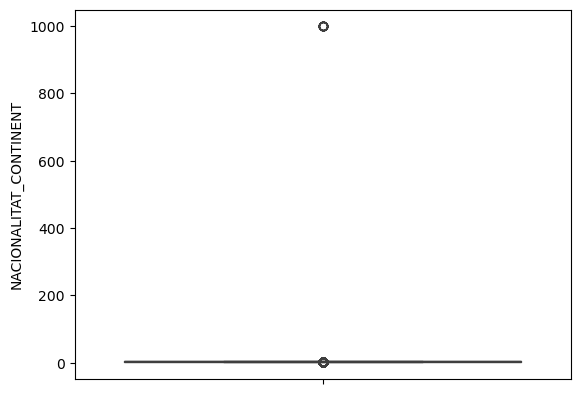

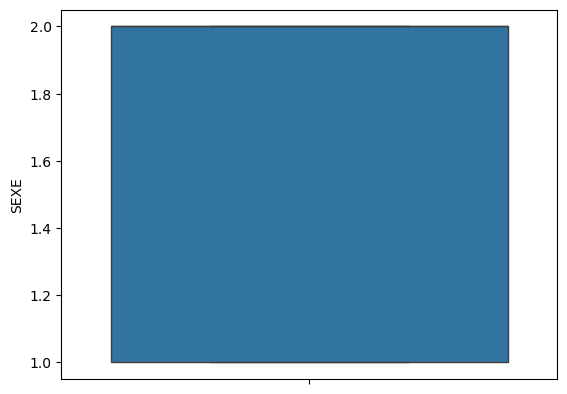

In [50]:
# Análisis de outliers:
for column in df.select_dtypes(include=[np.number]).columns:
    sns.boxplot(df[column])
    plt.show()

### Personas por domicilio:

In [51]:
# Lectura del csv de personas por domicilio:
df = pd.read_csv('../01-Ficheros Concatenados/personas_por_domicilio.csv')

In [52]:
# Cabecera de los datos:
df.head()

,Data_Referencia,Codi_Districte,Nom_Districte,Codi_Barri,Nom_Barri,AEB,Seccio_Censal,Valor,N_PERSONES_AGG
0,2007-01-01,1,Ciutat Vella,1,el Raval,1,1001,173,1
1,2007-01-01,1,Ciutat Vella,1,el Raval,1,1001,154,2
2,2007-01-01,1,Ciutat Vella,1,el Raval,1,1001,68,3
3,2007-01-01,1,Ciutat Vella,1,el Raval,1,1001,45,4
4,2007-01-01,1,Ciutat Vella,1,el Raval,1,1001,22,5


In [53]:
# Información de las columnas:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 157027 entries, 0 to 157026
Data columns (total 9 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   Data_Referencia  157027 non-null  object
 1   Codi_Districte   157027 non-null  int64 
 2   Nom_Districte    157027 non-null  object
 3   Codi_Barri       157027 non-null  int64 
 4   Nom_Barri        157027 non-null  object
 5   AEB              157027 non-null  int64 
 6   Seccio_Censal    157027 non-null  int64 
 7   Valor            157027 non-null  int64 
 8   N_PERSONES_AGG   157027 non-null  int64 
dtypes: int64(6), object(3)
memory usage: 10.8+ MB


In [54]:
# Descripción del dataframe:
df.describe()

,Codi_Districte,Codi_Barri,AEB,Seccio_Censal,Valor,N_PERSONES_AGG
count,157027.000000,157027.000000,157027.000000,157027.000000,157027.000000,157027.000000
mean,5.706560,33.137231,119.474957,5767.235189,70.534004,4.867755
std,2.944992,21.931777,65.550586,2945.715944,77.155082,2.543714
min,1.000000,1.000000,1.000000,1001.000000,1.000000,1.000000
25%,3.000000,13.000000,63.000000,3037.000000,5.000000,3.000000
50%,6.000000,31.000000,122.000000,6033.000000,30.000000,5.000000
75%,8.000000,52.000000,175.000000,8092.000000,124.000000,7.000000
max,10.000000,73.000000,233.000000,10237.000000,459.000000,9.000000


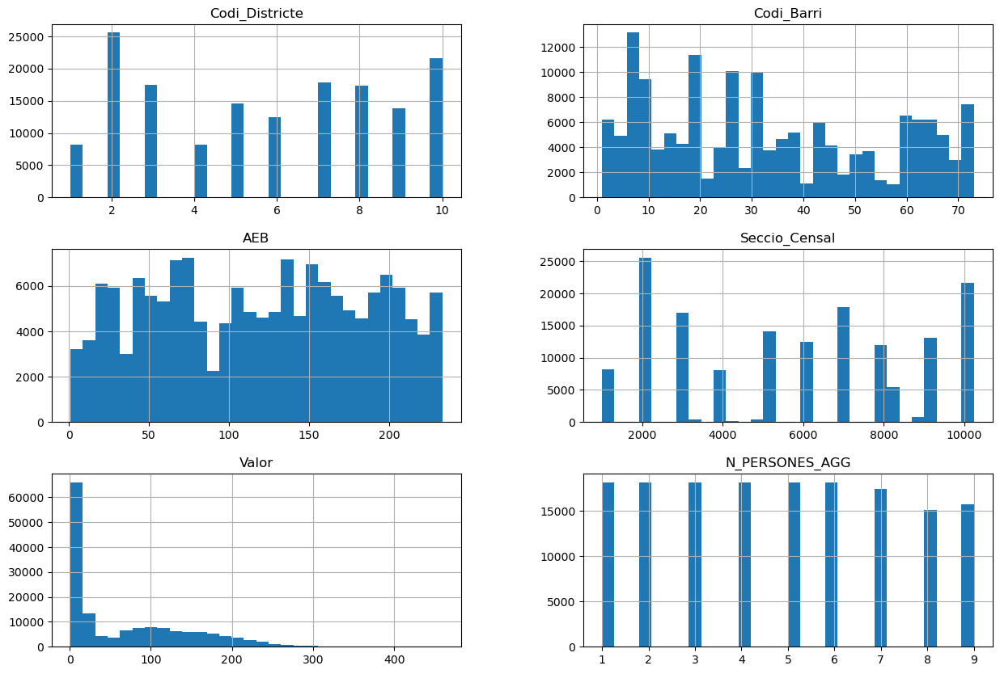

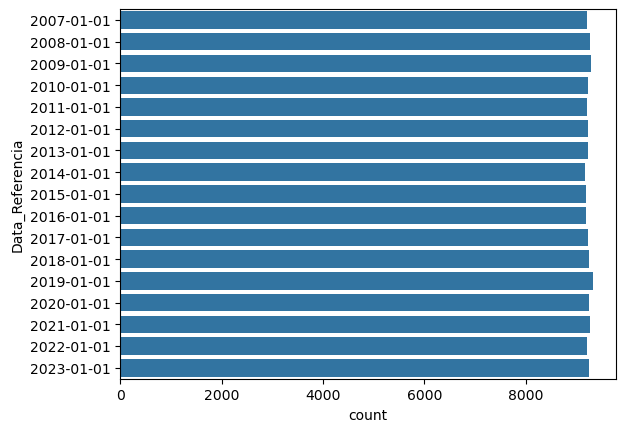

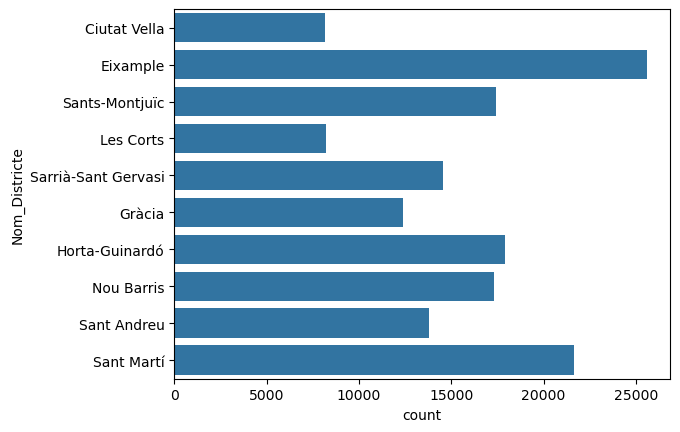

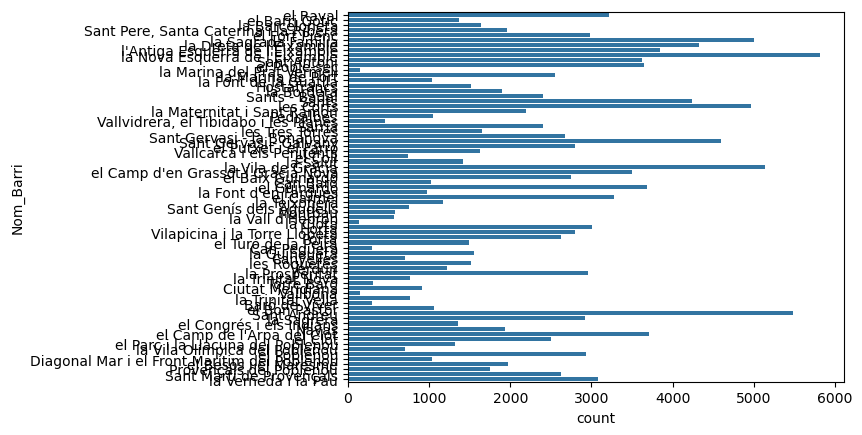

In [55]:
# Análisis de las variables:
df.hist(bins=30, figsize=(15, 10))
plt.show()

for column in df.select_dtypes(include=['object']).columns:
    sns.countplot(y=column, data=df)
    plt.show()

c:\Users\patry\anaconda3\envs\BaseGrafos\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


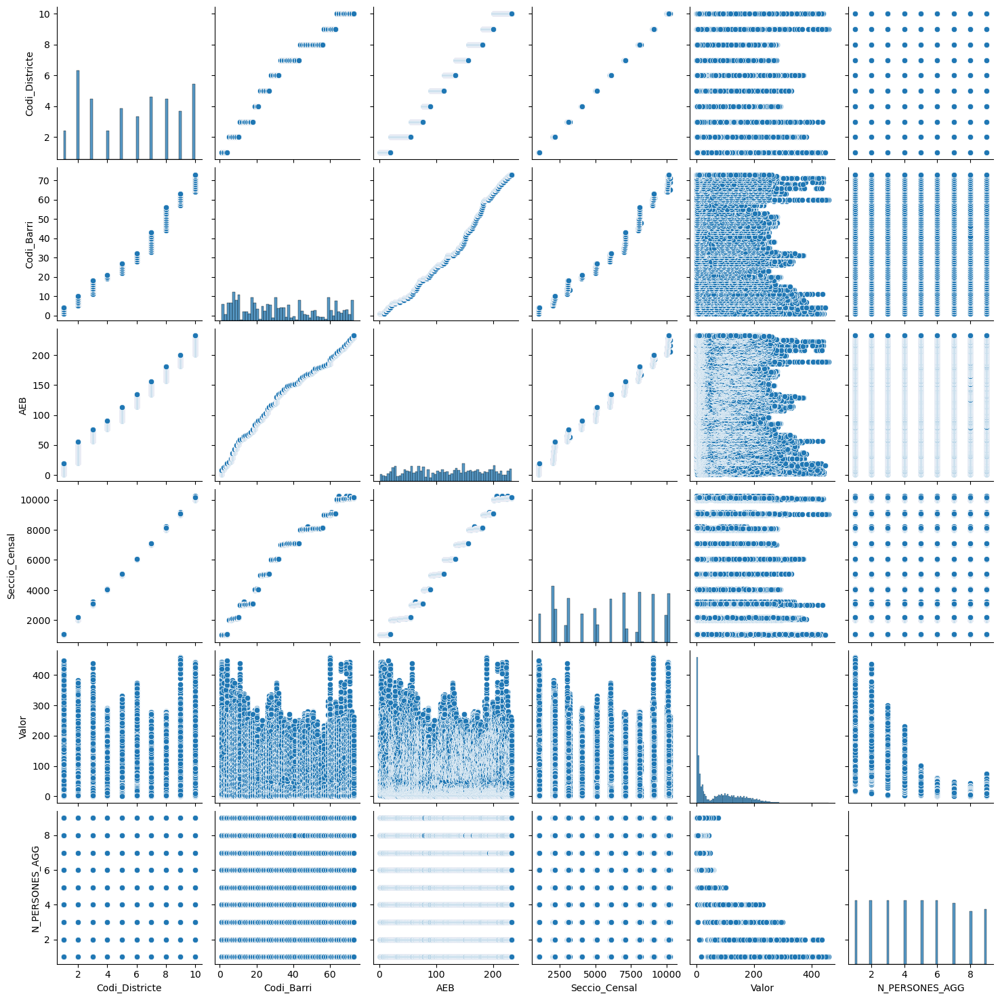

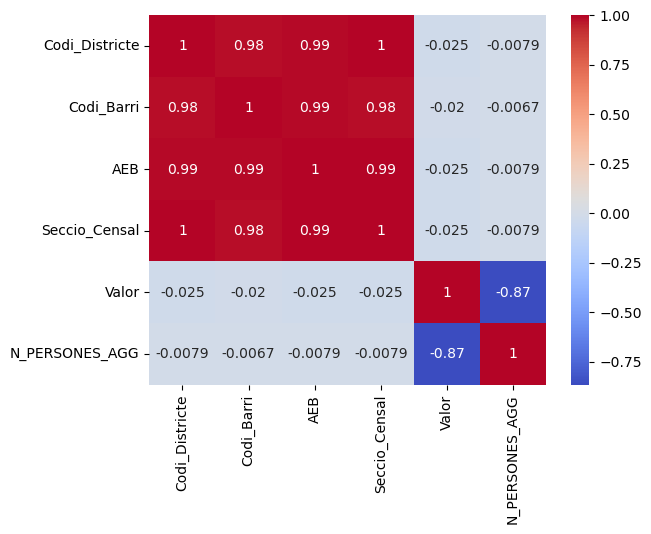

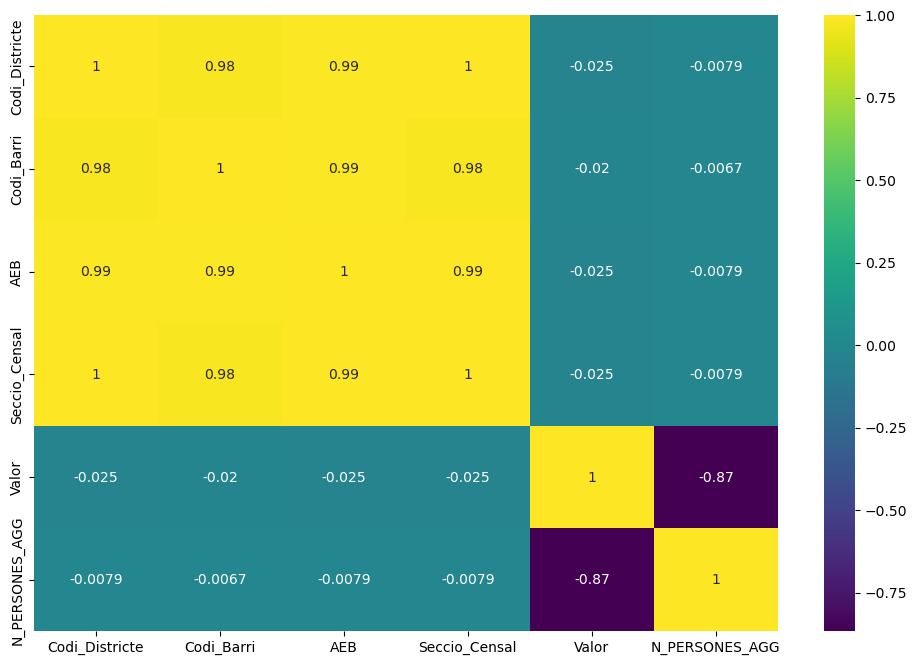

In [56]:
# Análisis de correlación:
sns.pairplot(df)
plt.show()

# Se quitan las variables no numéricas y se reemplazan los valores .. por 0 para poder realizar la correlación:
df=df.drop(columns=['Nom_Districte','Nom_Barri','Data_Referencia'])
df["Valor"]=df["Valor"].replace('..',0)

# Se define la matriz de correlación y se pinta:
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='viridis')
plt.show()

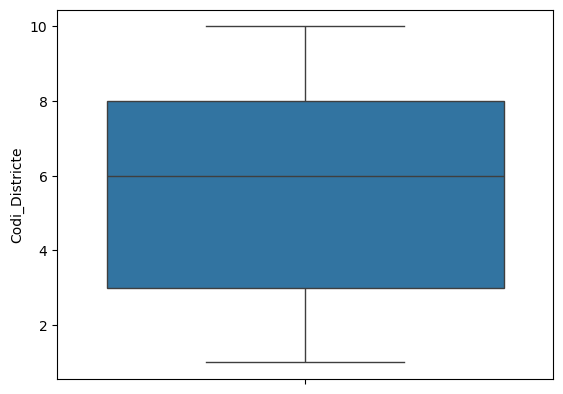

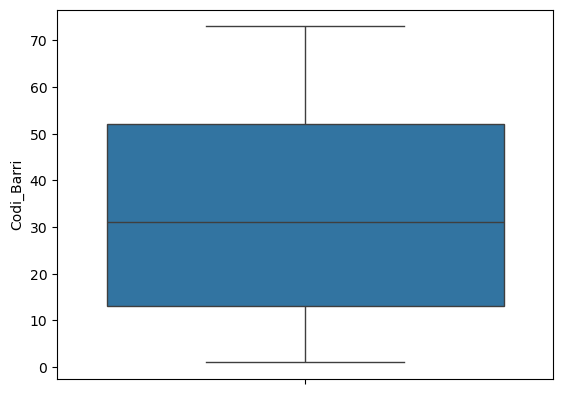

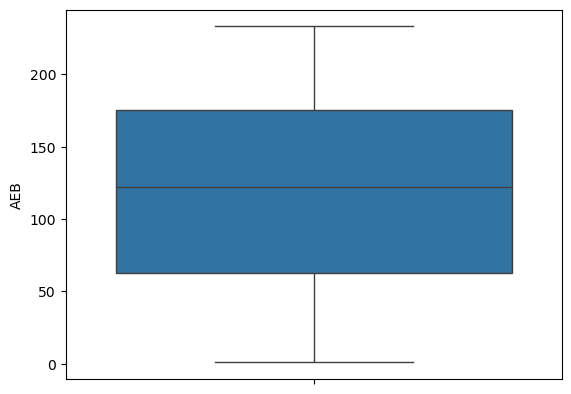

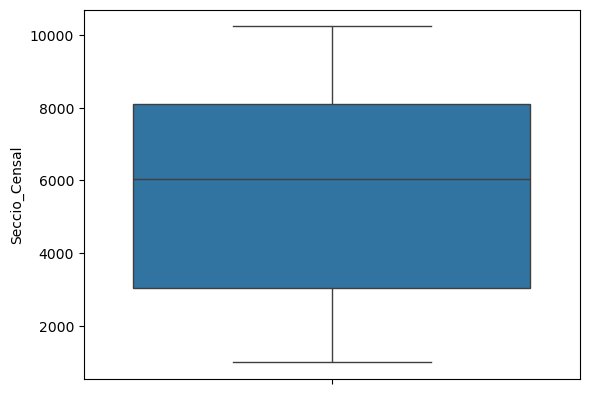

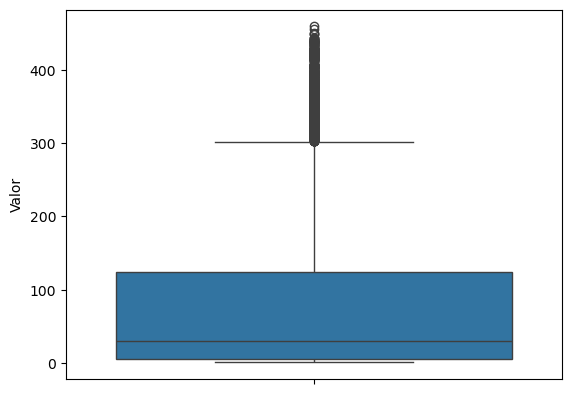

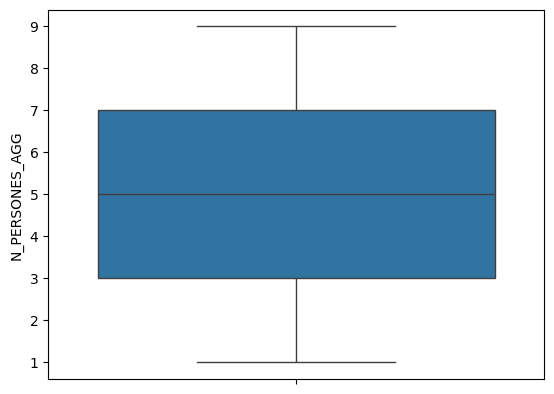

In [57]:
# Análisis de outliers:
for column in df.select_dtypes(include=[np.number]).columns:
    sns.boxplot(df[column])
    plt.show()

### Renta bruta por persona:

In [58]:
# Lectura del csv de la renta bruta por persona:
df = pd.read_csv('../01-Ficheros Concatenados/renta_bruta_persona.csv')

In [59]:
# Cabecera de los datos:
df.head()

,Any,Codi_Districte,Nom_Districte,Codi_Barri,Nom_Barri,Seccio_Censal,Import_Renda_Bruta_€,Import_Renda_Bruta_€
0,2015,1,Ciutat Vella,1,el Raval,1,10871.0,NaN
1,2015,1,Ciutat Vella,1,el Raval,2,8635.0,NaN
2,2015,1,Ciutat Vella,1,el Raval,3,8335.0,NaN
3,2015,1,Ciutat Vella,1,el Raval,4,11180.0,NaN
4,2015,1,Ciutat Vella,1,el Raval,5,8853.0,NaN


In [60]:
# Información de las columnas:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7476 entries, 0 to 7475
Data columns (total 8 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Any                                   7476 non-null   int64  
 1   Codi_Districte                        7476 non-null   int64  
 2   Nom_Districte                         7476 non-null   object 
 3   Codi_Barri                            7476 non-null   int64  
 4   Nom_Barri                             7476 non-null   object 
 5   Seccio_Censal                         7476 non-null   int64  
 6   Import_Renda_Bruta_€                  5340 non-null   float64
 7   Import_Renda_Bruta_€                  2136 non-null   float64
dtypes: float64(2), int64(4), object(2)
memory usage: 467.4+ KB


In [61]:
# Descripción del dataframe:
df.describe()

,Any,Codi_Districte,Codi_Barri,Seccio_Censal,Import_Renda_Bruta_€,Import_Renda_Bruta_€
count,7476.000000,7476.000000,7476.000000,7476.000000,5340.000000,2136.000000
mean,2018.000000,5.723783,33.246255,60.645131,20058.589139,21909.639981
std,2.000134,2.937353,21.884200,41.552854,7350.178677,7534.322326
min,2015.000000,1.000000,1.000000,1.000000,6797.000000,7328.000000
25%,2016.000000,3.000000,13.000000,27.750000,15400.000000,17087.750000
50%,2018.000000,6.000000,31.000000,54.000000,18617.000000,20632.500000
75%,2020.000000,8.000000,52.000000,87.000000,22659.500000,24685.500000
max,2021.000000,10.000000,73.000000,237.000000,47029.000000,46570.000000


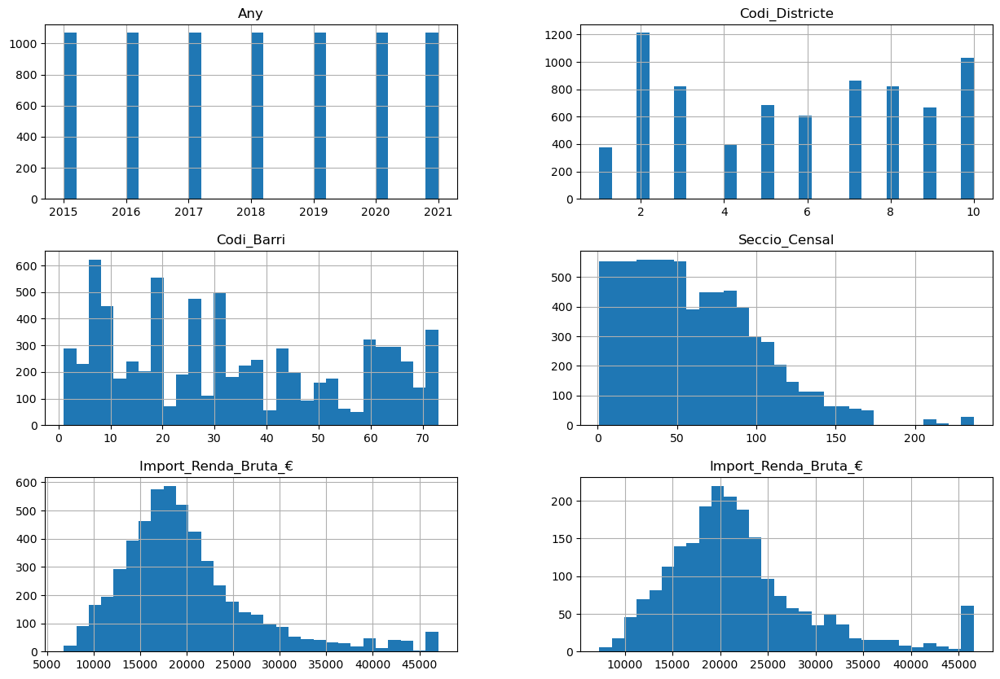

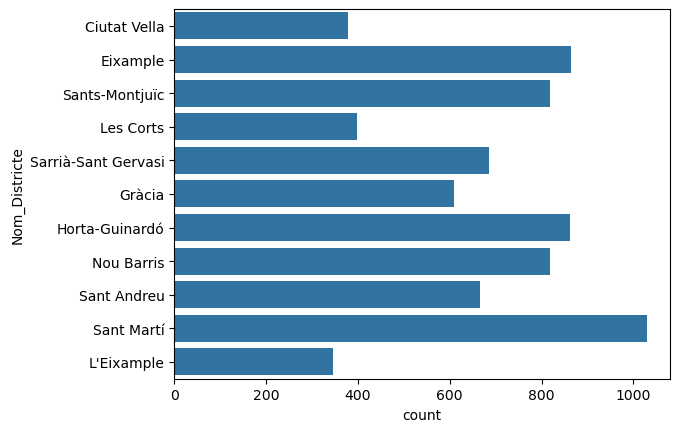

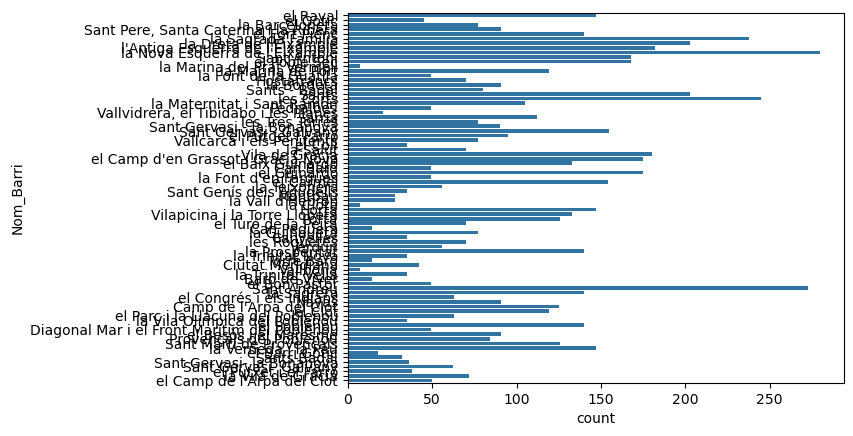

In [62]:
# Análisis de las variables:
df.hist(bins=30, figsize=(15, 10))
plt.show()

for column in df.select_dtypes(include=['object']).columns:
    sns.countplot(y=column, data=df)
    plt.show()

c:\Users\patry\anaconda3\envs\BaseGrafos\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


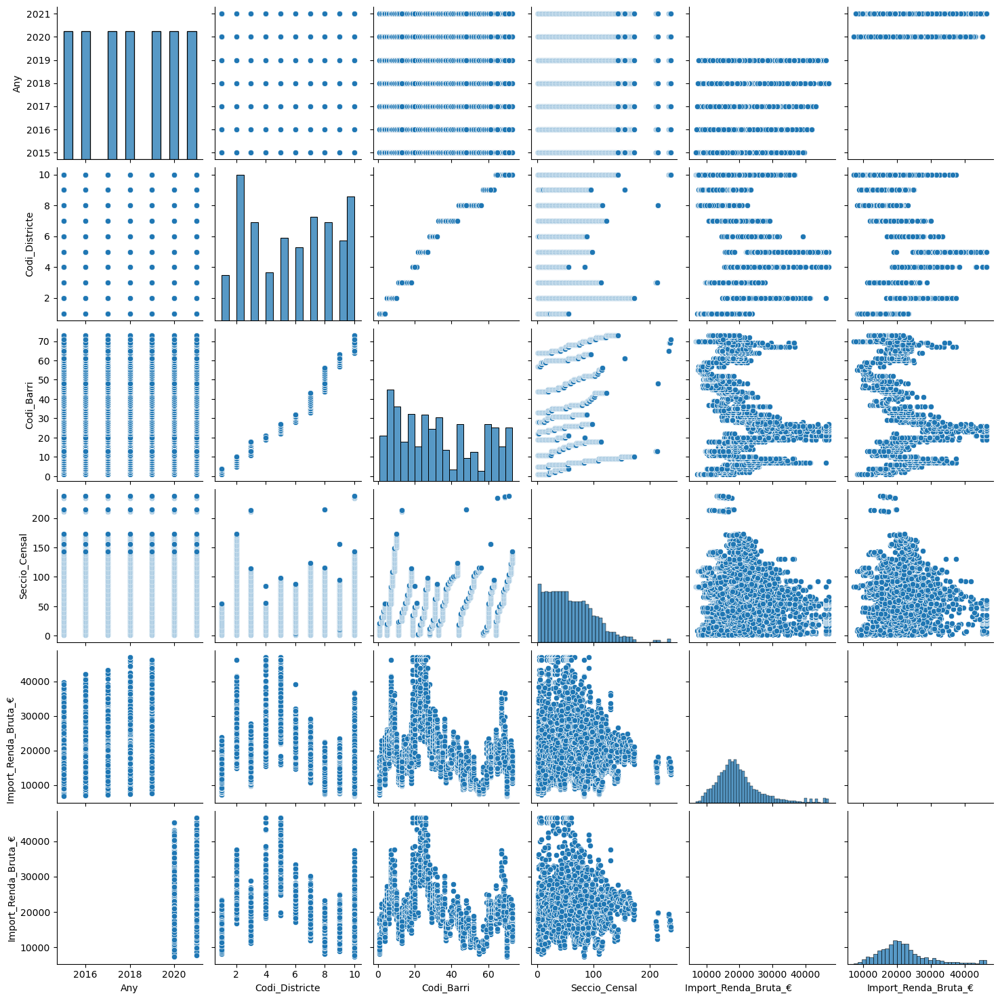

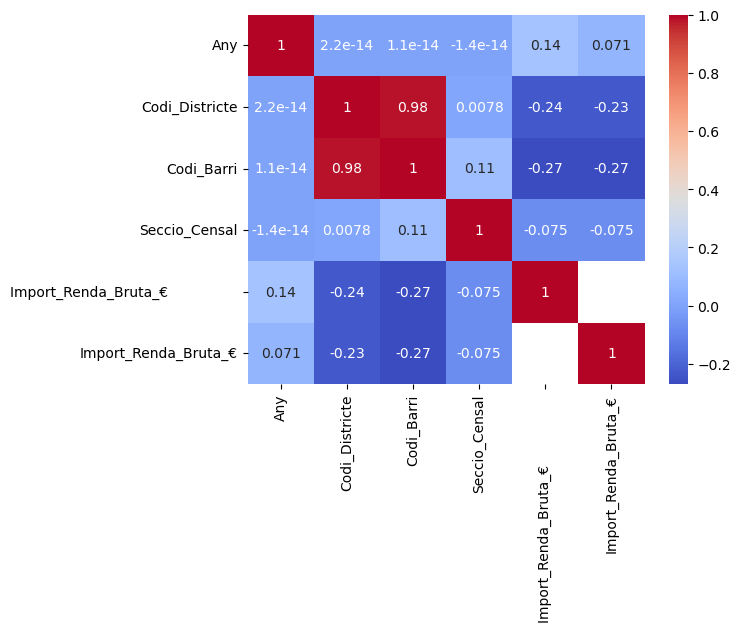

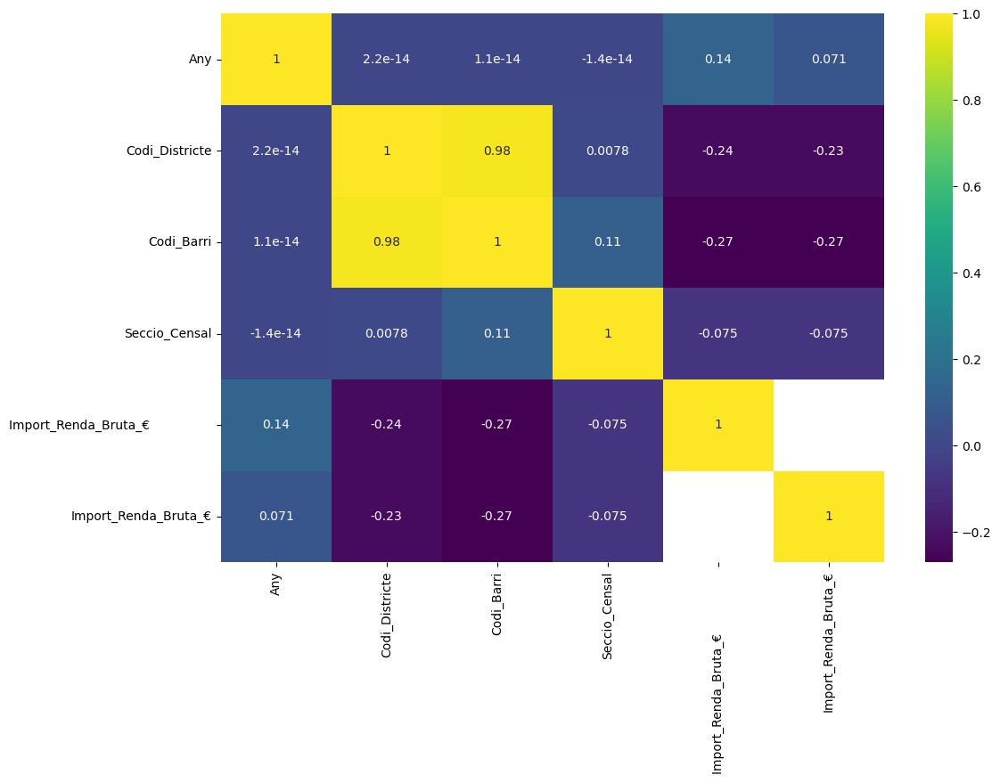

In [63]:
# Análisis de correlación:
sns.pairplot(df)
plt.show()

# Se quitan las variables no numéricas para poder realizar la correlación:
df=df.drop(columns=['Nom_Districte','Nom_Barri'])


# Se define la matriz de correlación y se pinta:
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='viridis')
plt.show()

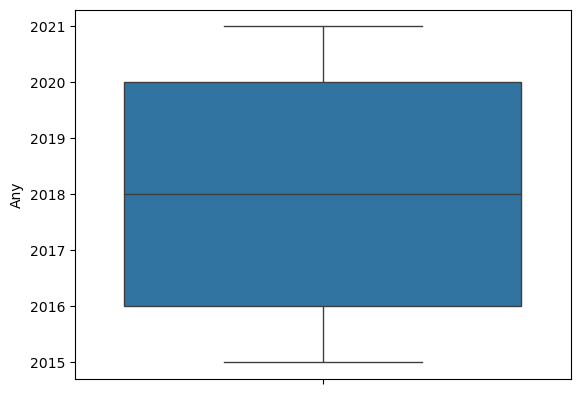

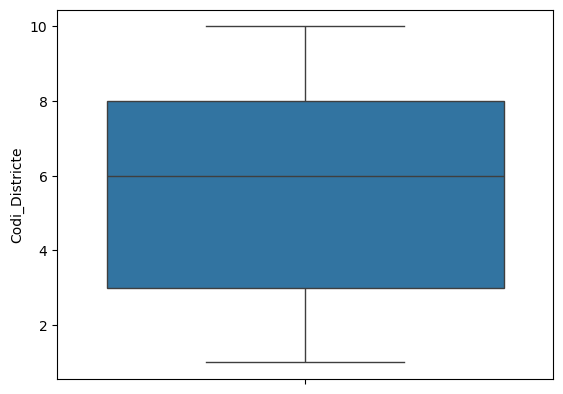

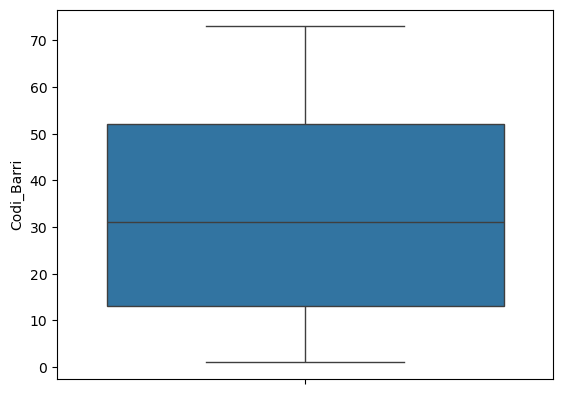

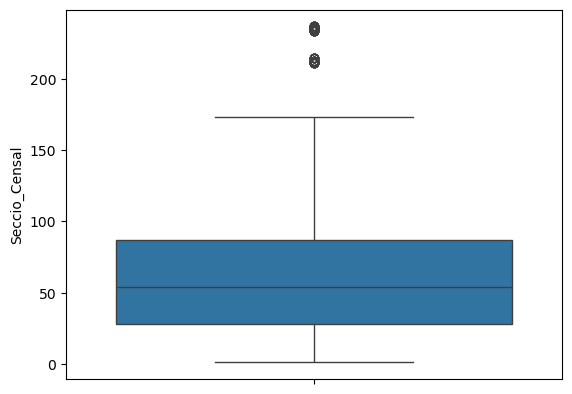

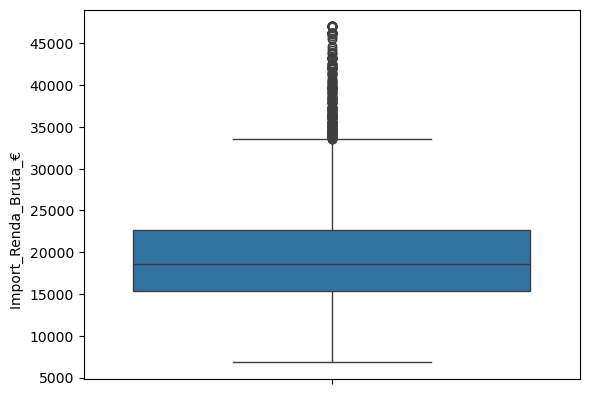

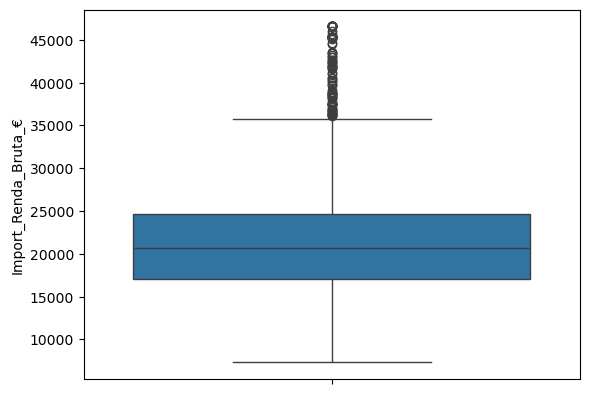

In [64]:
# Análisis de outliers:
for column in df.select_dtypes(include=[np.number]).columns:
    sns.boxplot(df[column])
    plt.show()

### Valor catastral:

In [65]:
# Lectura del csv de valor catastral:
df = pd.read_csv('../01-Ficheros Concatenados/valor_catastral.csv')

In [66]:
# Cabecera de los datos:
df.head()

,Any,Codi_districte,Nom_districte,Codi_barri,Nom_barri,Seccio_censal,Desc_valors,Valors
0,2018,1,Ciutat Vella,1,el Raval,1,Valor_cadastral_total_€,67059673.9
1,2018,1,Ciutat Vella,1,el Raval,2,Valor_cadastral_total_€,49981470.7
2,2018,1,Ciutat Vella,1,el Raval,3,Valor_cadastral_total_€,71692363.5
3,2018,1,Ciutat Vella,1,el Raval,4,Valor_cadastral_total_€,93534623.3
4,2018,1,Ciutat Vella,1,el Raval,5,Valor_cadastral_total_€,96442596.5


In [67]:
# Información de las columnas:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44856 entries, 0 to 44855
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Any             44856 non-null  int64  
 1   Codi_districte  44856 non-null  int64  
 2   Nom_districte   44856 non-null  object 
 3   Codi_barri      44856 non-null  int64  
 4   Nom_barri       44856 non-null  object 
 5   Seccio_censal   44856 non-null  int64  
 6   Desc_valors     44856 non-null  object 
 7   Valors          44856 non-null  float64
dtypes: float64(1), int64(4), object(3)
memory usage: 2.7+ MB


In [68]:
# Descripción del dataframe:
df.describe()

,Any,Codi_districte,Codi_barri,Seccio_censal,Valors
count,44856.000000,44856.000000,44856.000000,44856.000000,4.485600e+04
mean,2021.000000,5.723783,33.246255,60.645131,2.501063e+07
std,2.000022,2.937189,21.882980,41.550538,4.647281e+07
min,2018.000000,1.000000,1.000000,1.000000,9.377000e+01
25%,2019.000000,3.000000,13.000000,27.750000,5.803500e+02
50%,2021.000000,6.000000,31.000000,54.000000,1.924835e+06
75%,2023.000000,8.000000,52.000000,87.000000,3.564013e+07
max,2024.000000,10.000000,73.000000,237.000000,2.017990e+09


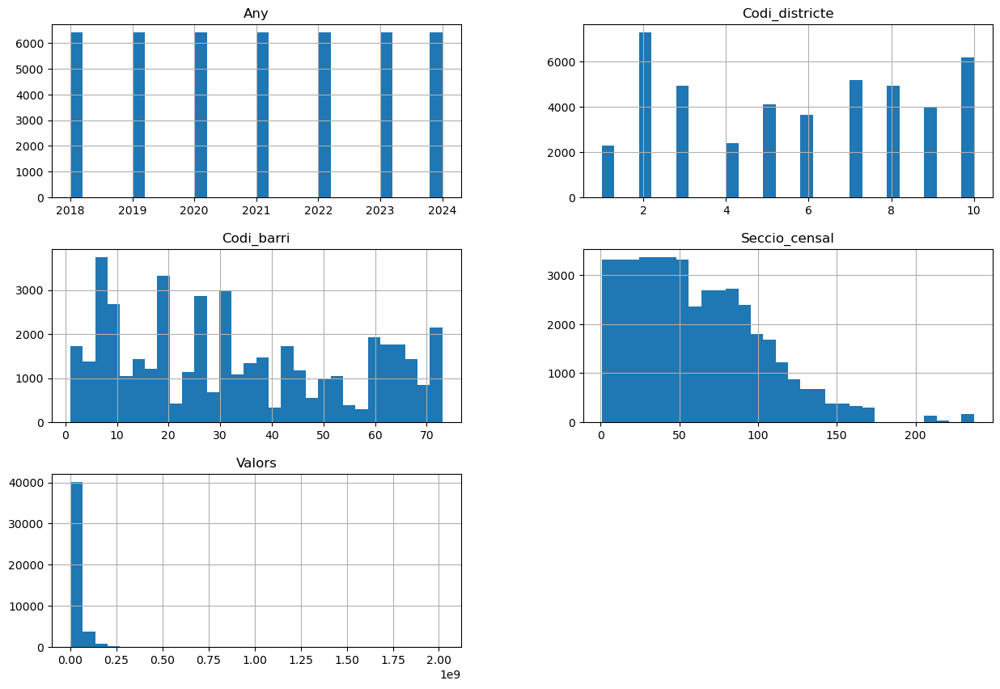

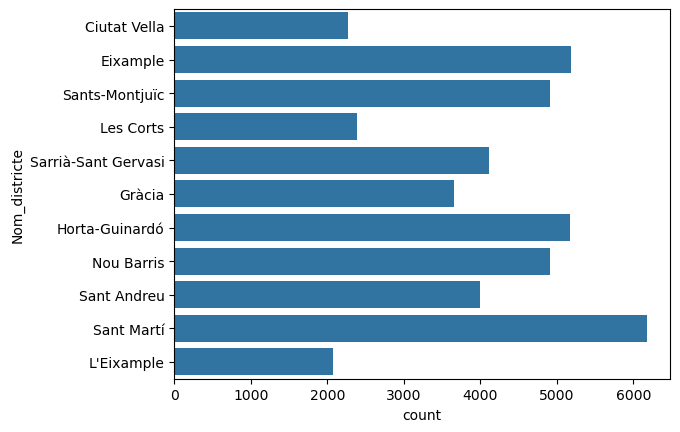

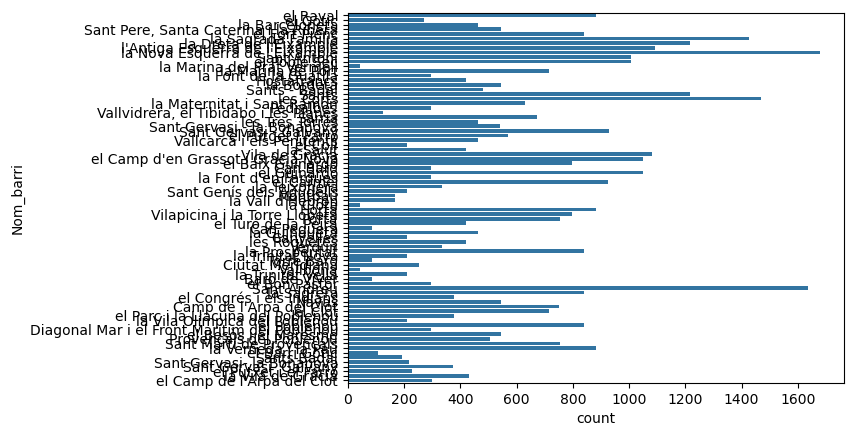

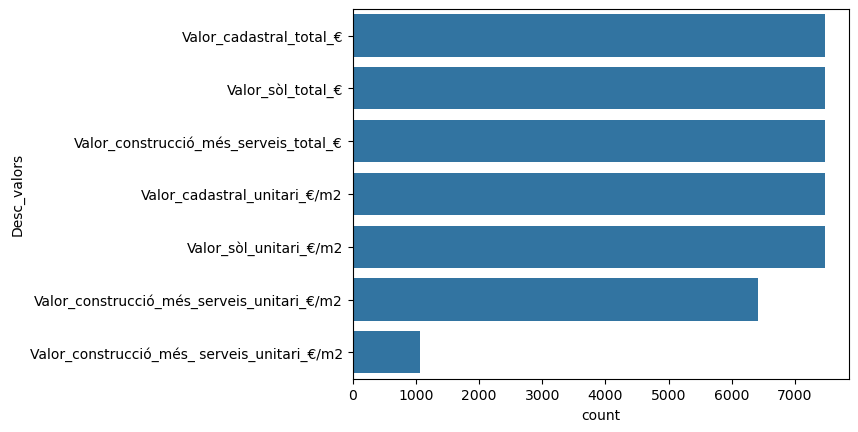

In [69]:
# Análisis de las variables:
df.hist(bins=30, figsize=(15, 10))
plt.show()

for column in df.select_dtypes(include=['object']).columns:
    sns.countplot(y=column, data=df)
    plt.show()

c:\Users\patry\anaconda3\envs\BaseGrafos\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


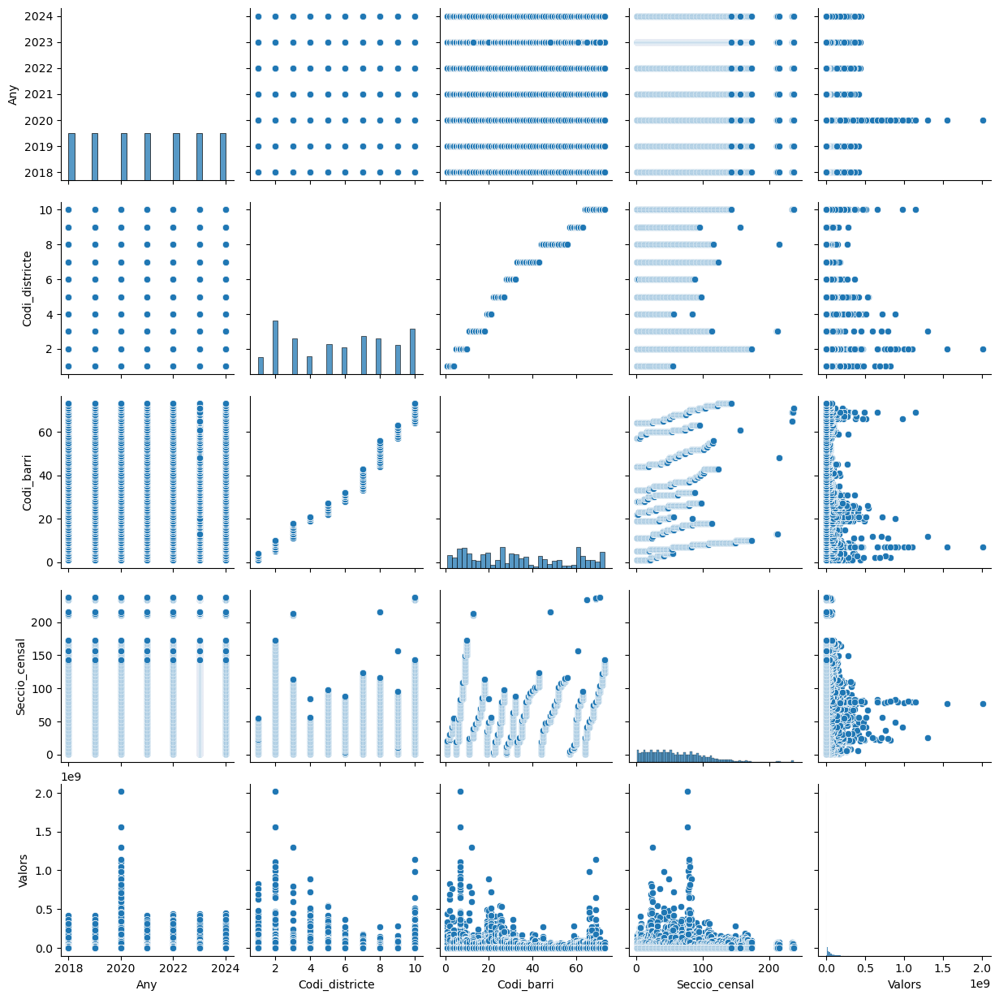

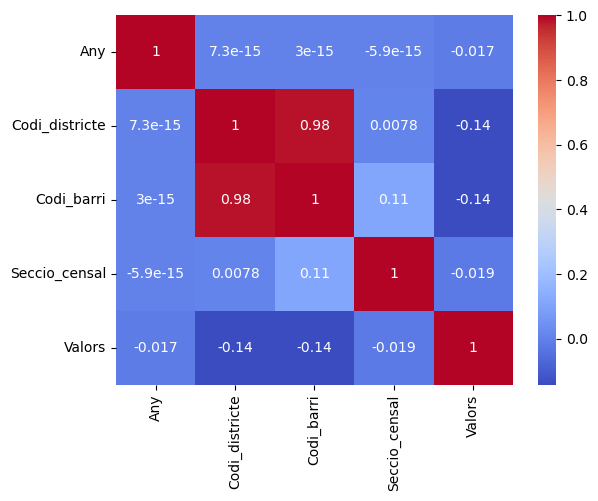

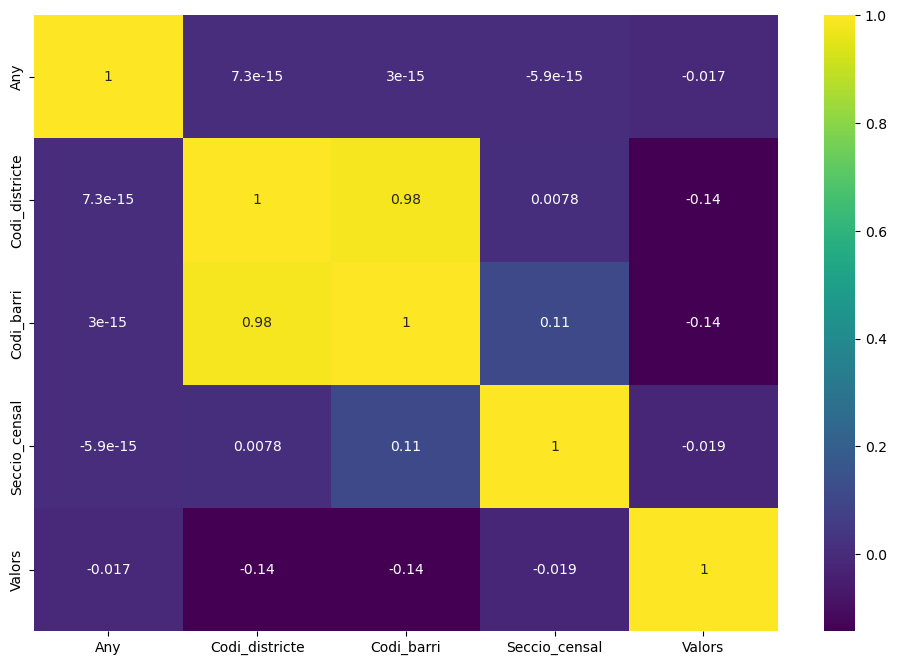

In [70]:
# Análisis de correlación:
sns.pairplot(df)
plt.show()

# Se quitan las variables no numéricas y se reemplazan los valores .. por 0 para poder realizar la correlación:
df=df.drop(columns=['Nom_districte','Nom_barri','Desc_valors'])

# Se define la matriz de correlación y se pinta:
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='viridis')
plt.show()

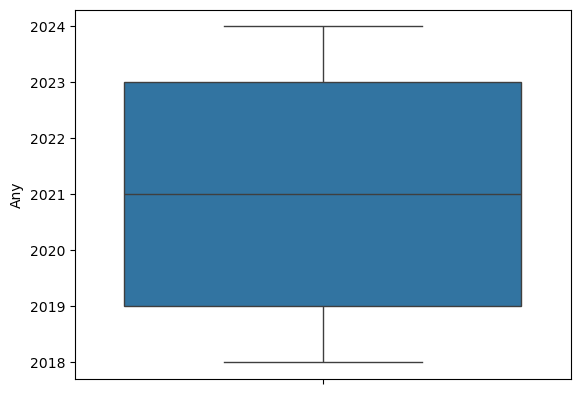

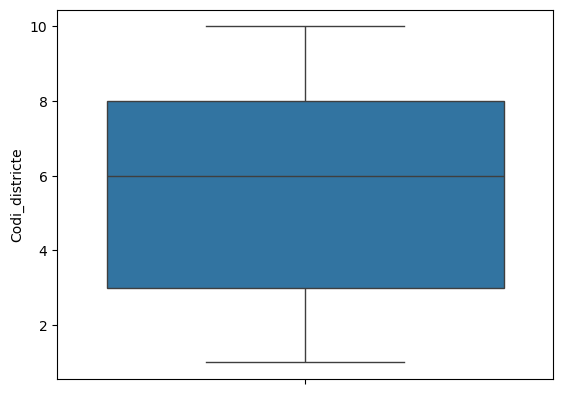

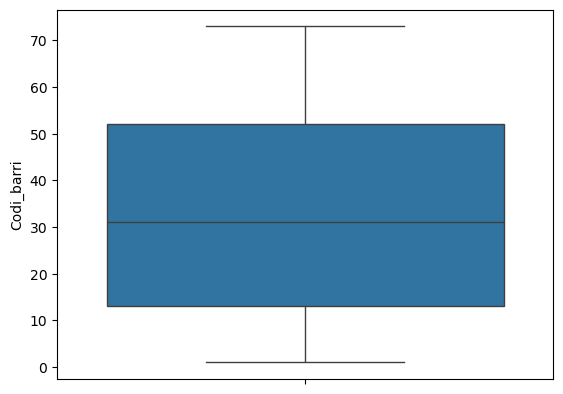

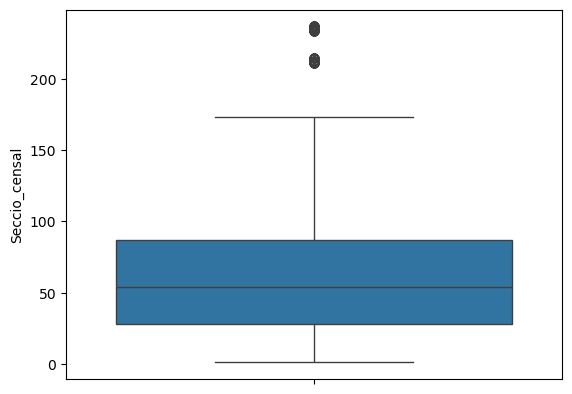

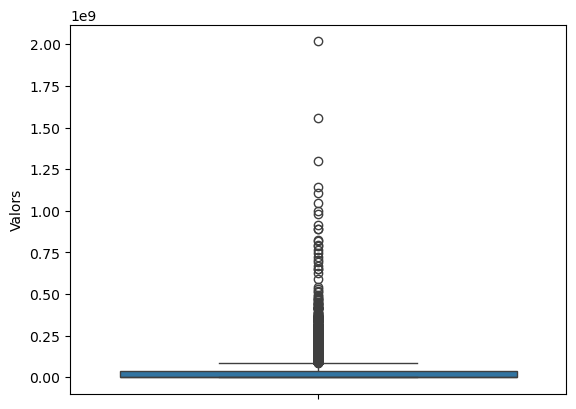

In [71]:
# Análisis de outliers:
for column in df.select_dtypes(include=[np.number]).columns:
    sns.boxplot(df[column])
    plt.show()